# ROI Analysis Runner

This notebook runs the generalized ROI analysis functions with chin support:

- Single video (DATASET_1/10-gt/vid.avi):
  - POS vs GREEN by ROI with HRs
  - All-ROIs plots with peaks and cross-correlation
  - Sliding cross-correlation (unfiltered and filtered)
- UBFC dataset-wide analysis (here limited to DATASET_1), saving CSV results




In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from roi_analysis import (
    analyze_video_pos_green_with_plots,
    plot_all_rois_signals_and_xcorr,
    plot_rois_xcorr_from_video,
    sliding_xcorr_lag_from_video,
    analyze_ubfc_lag_metrics_with_hr_filter,
)

%matplotlib inline



In [2]:
# Parameters and paths
fs = 30
window_length = 60
start_time = 5

base_folder = 'UBFC_DATASET_MERGED'
dataset_name = 'DATASET_1'
subject_dir = '10-gt'  # single video to analyze
single_video_path = os.path.join(base_folder, dataset_name, subject_dir, 'vid.avi')

print('Single video path:', single_video_path)



Single video path: UBFC_DATASET_MERGED\DATASET_1\10-gt\vid.avi


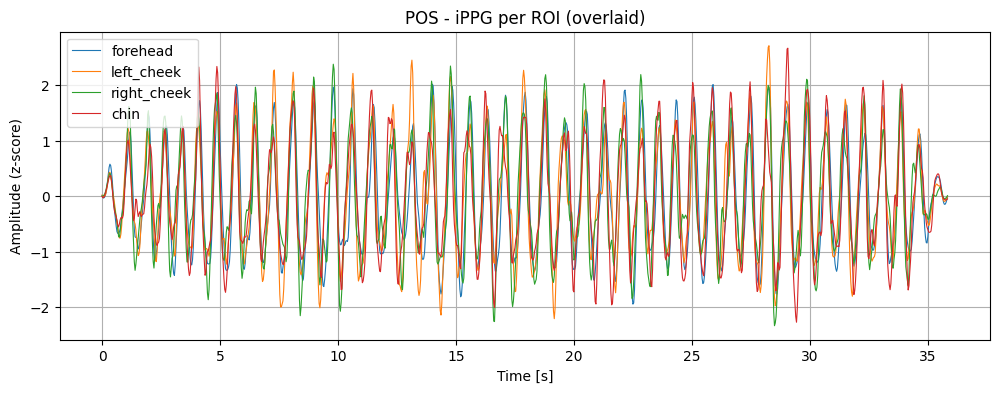

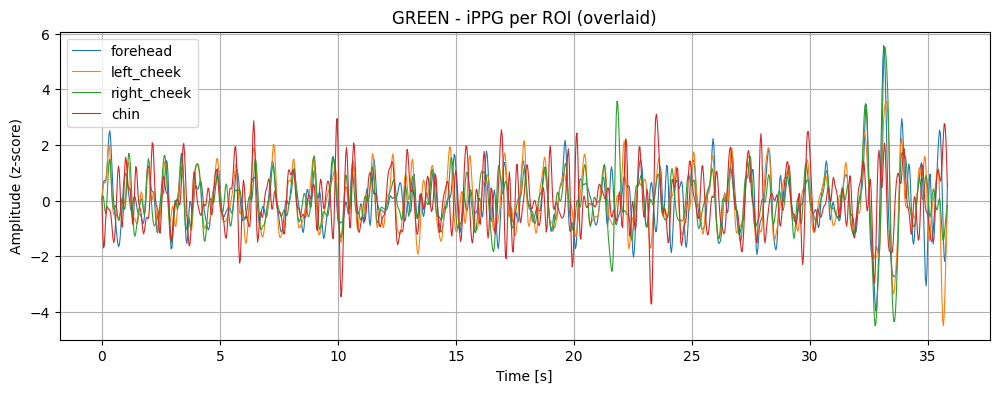

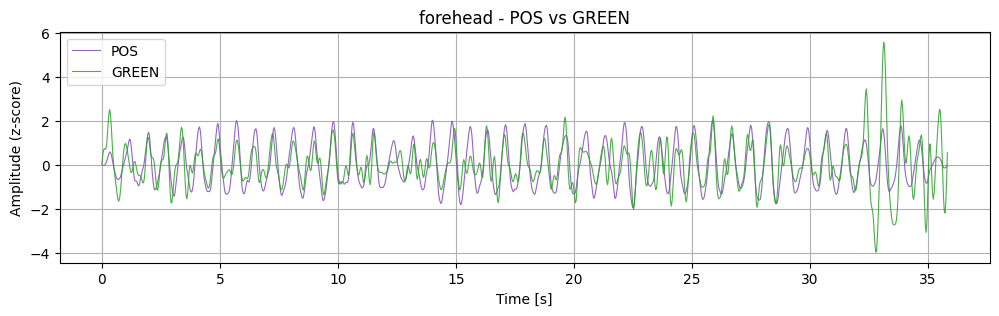

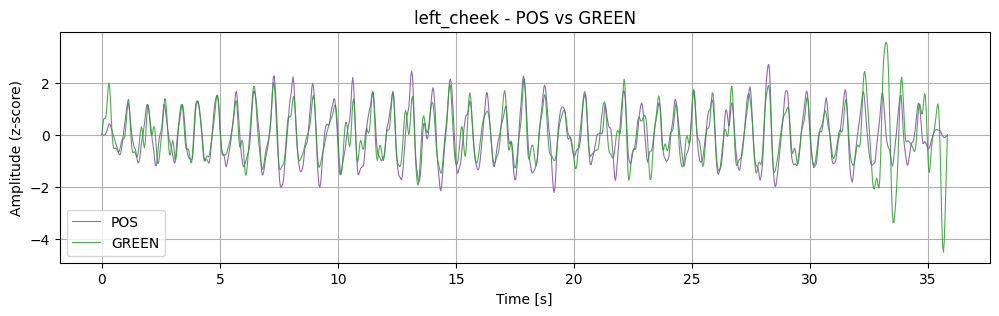

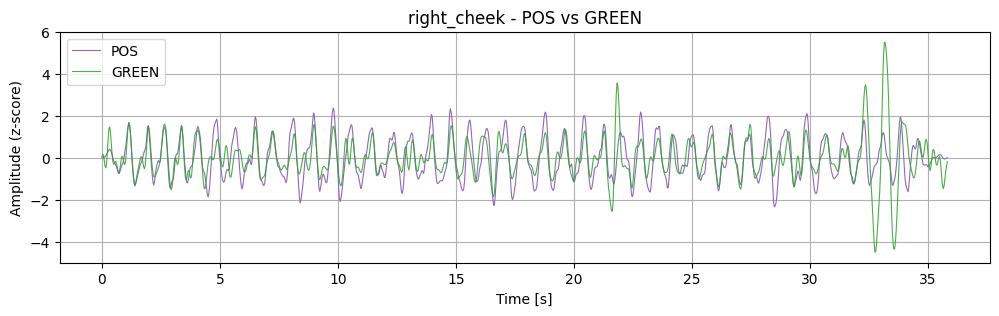

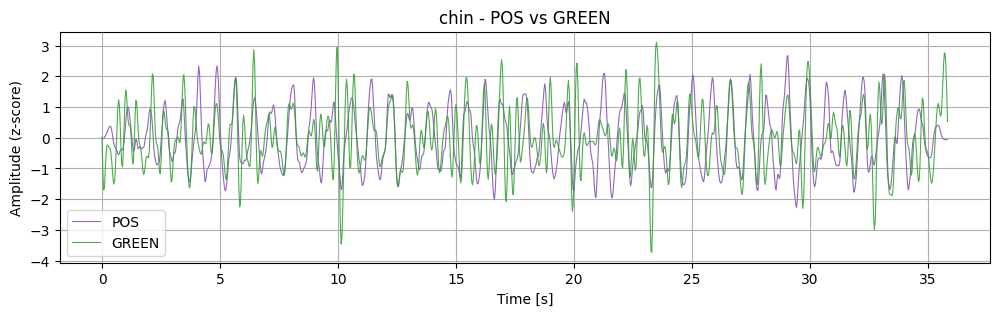

HR POS (bpm) by ROI:
  chin        : 77.34
  forehead    : 77.34
  left_cheek  : 77.34
  right_cheek : 77.34
HR GREEN (bpm) by ROI:
  chin        : 77.34
  forehead    : 77.34
  left_cheek  : 77.34
  right_cheek : 77.34


In [3]:
# Single video: POS and GREEN analysis per ROI (includes chin)
pos_signals, green_signals, hr_pos, hr_green = analyze_video_pos_green_with_plots(
    video_path=single_video_path,
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
)

print('HR POS (bpm) by ROI:')
for k, v in sorted(hr_pos.items()):
    print(f'  {k:12s}: {v:.2f}')

print('HR GREEN (bpm) by ROI:')
for k, v in sorted(hr_green.items()):
    print(f'  {k:12s}: {v:.2f}')



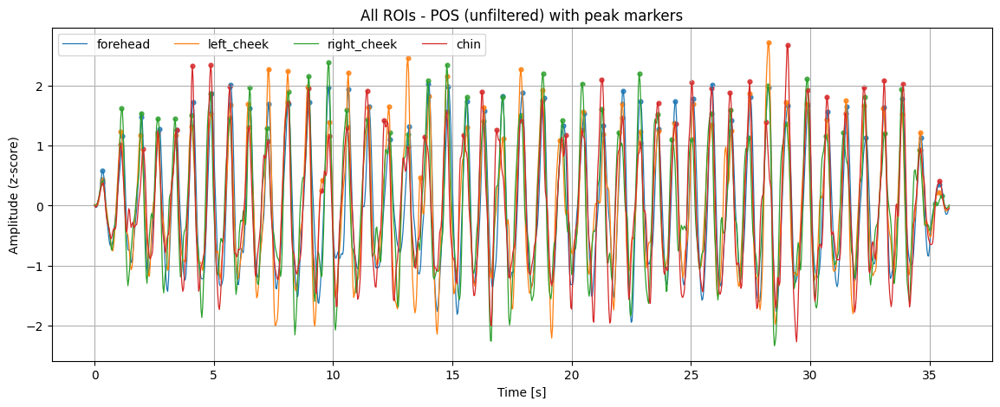

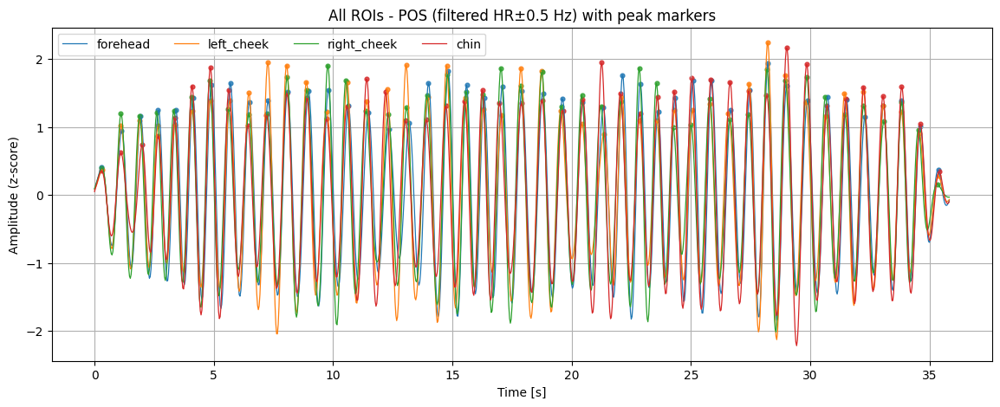

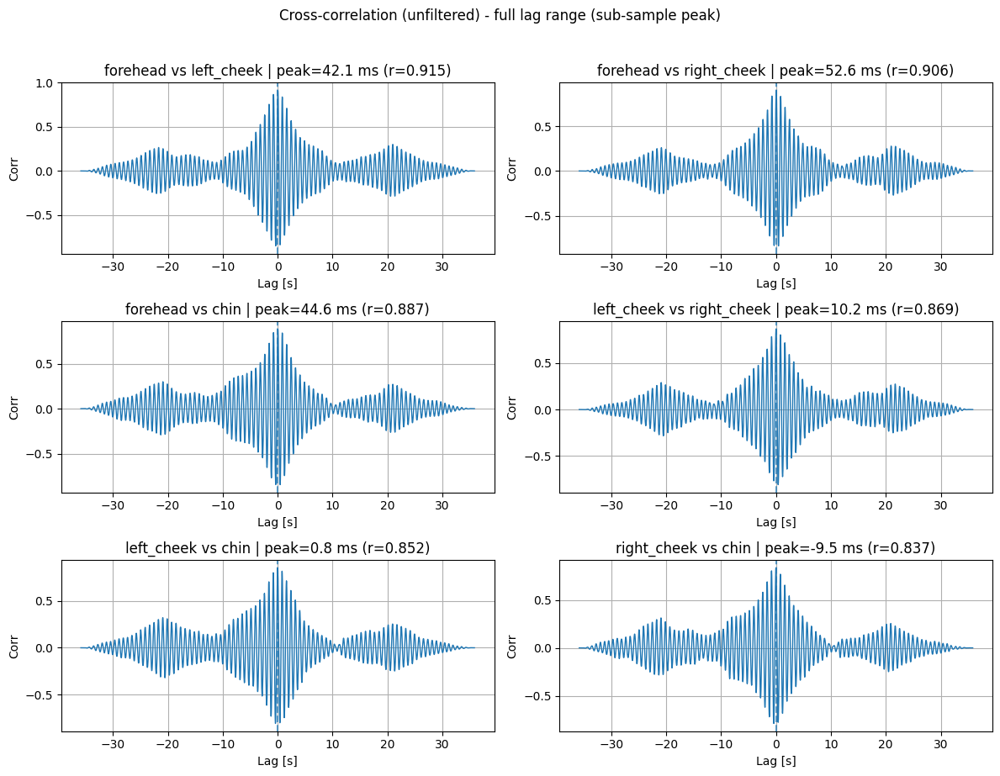

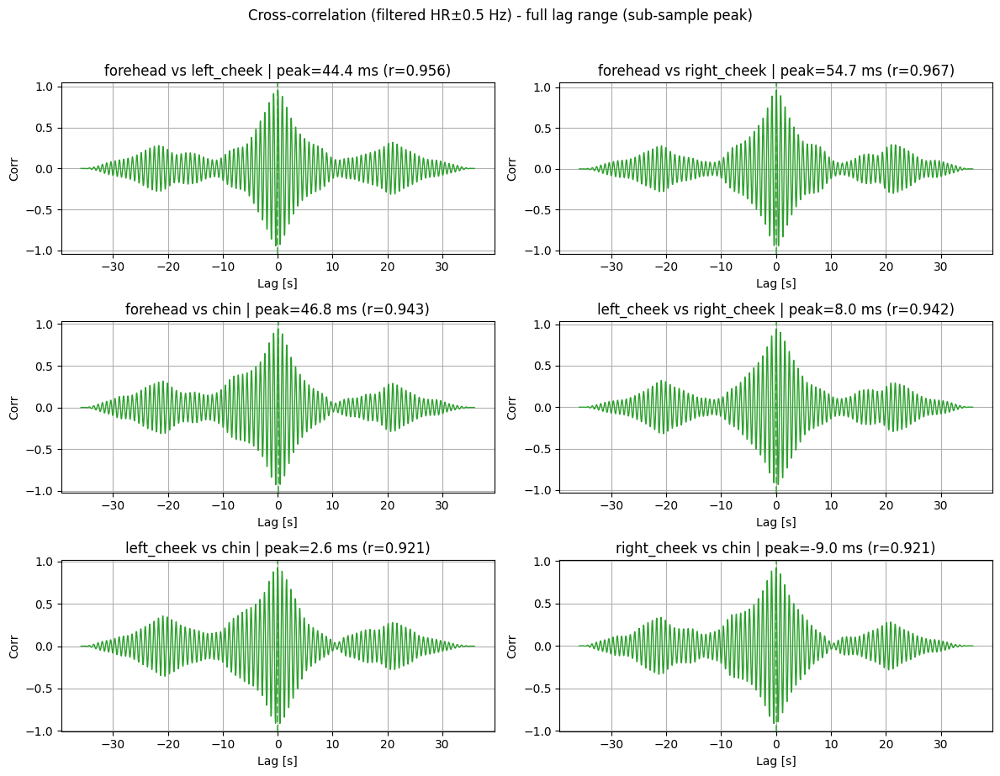

In [4]:
# Single video: All ROIs plots with peaks and cross-correlation (includes chin)
_ = plot_rois_xcorr_from_video(
    video_path=single_video_path,
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    show_filtered=True, normalize=True
)



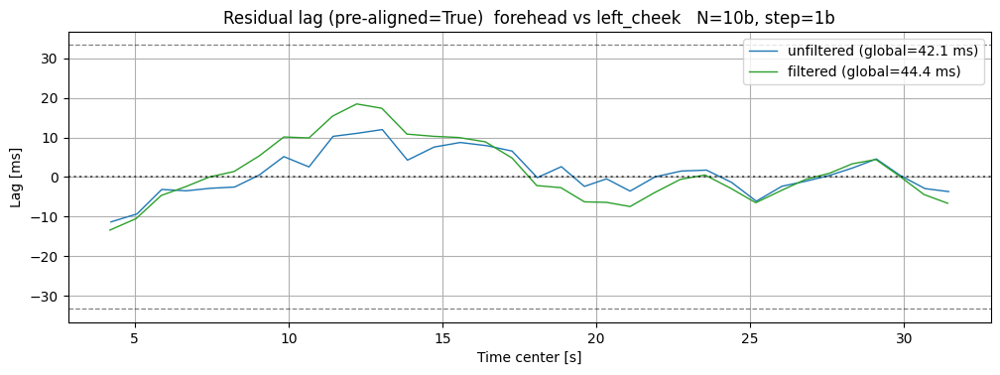

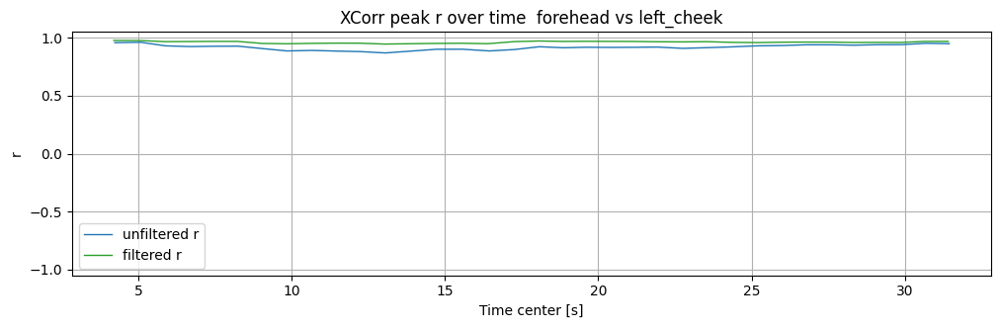

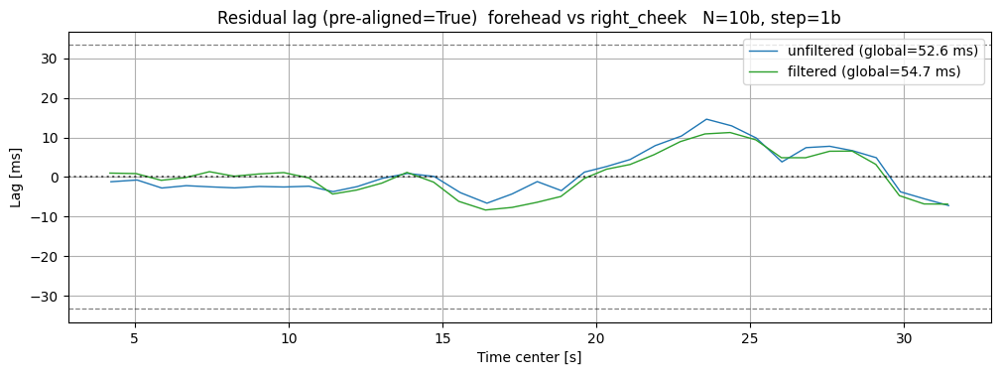

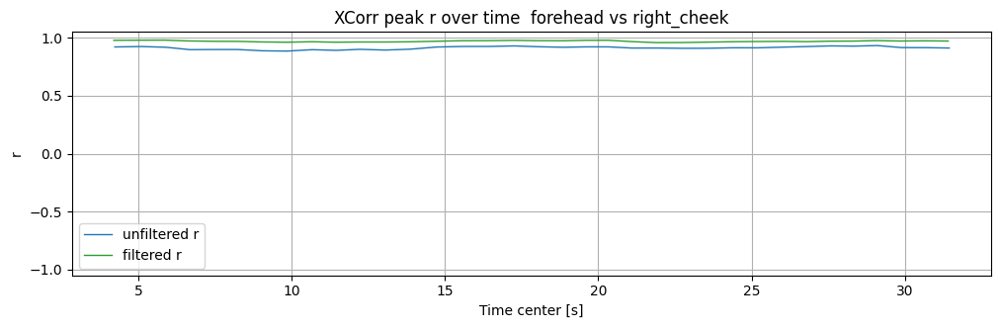

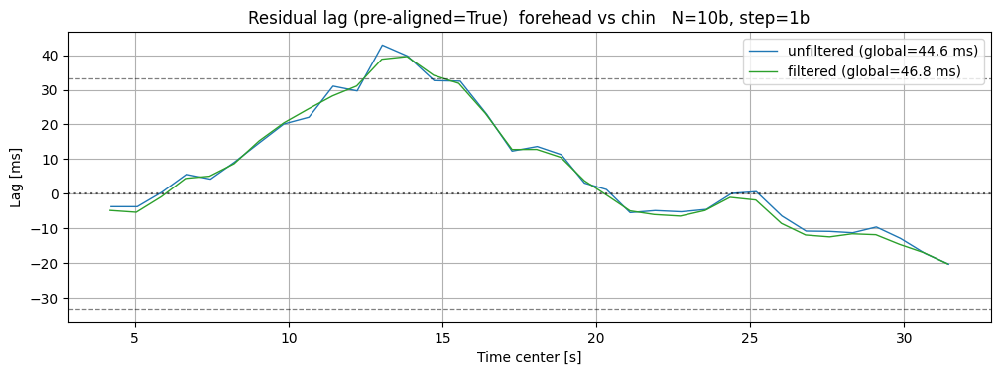

...

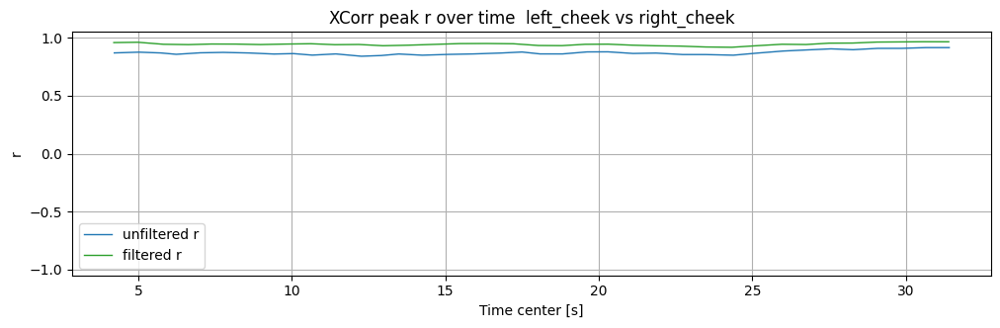

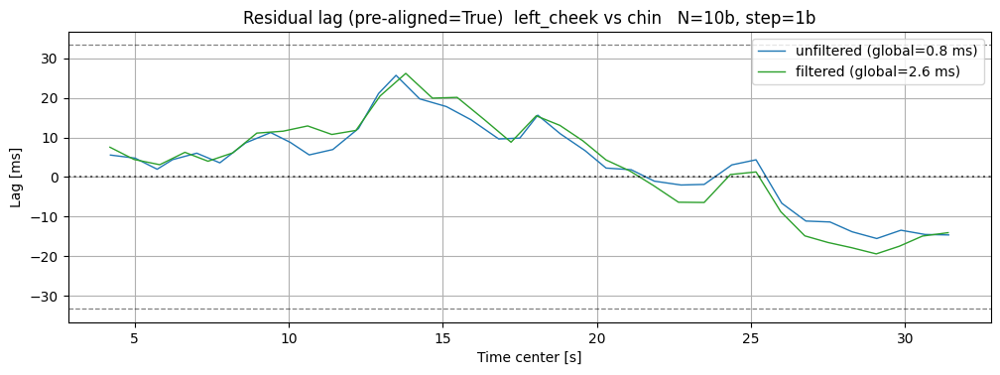

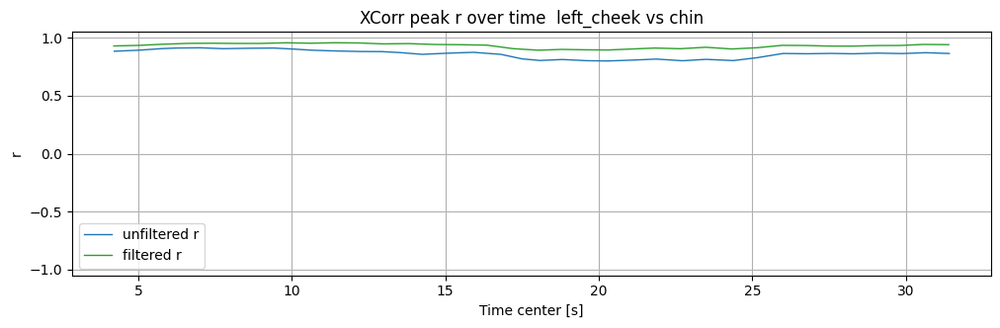

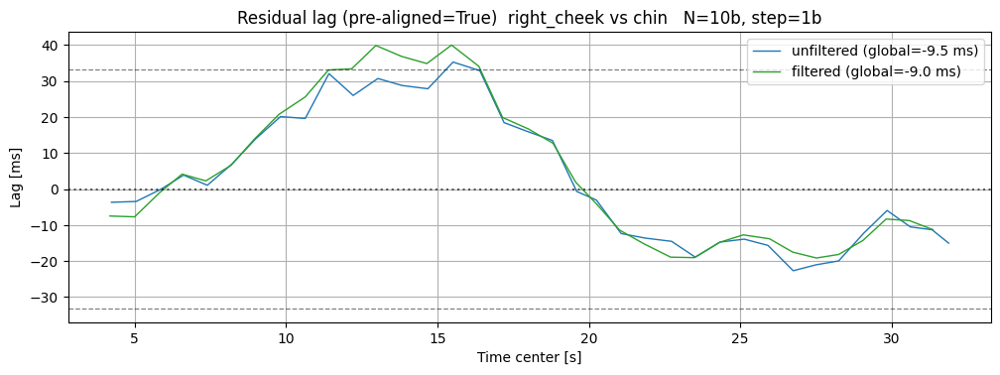

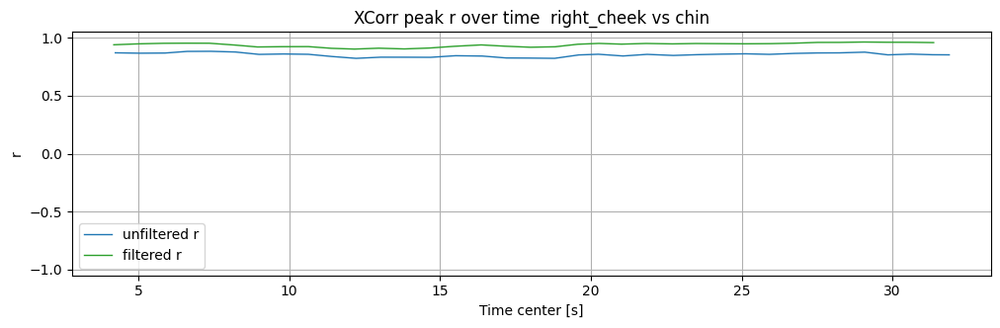

Computed sliding xcorr for ROI pairs:
  ('forehead', 'left_cheek')
  ('forehead', 'right_cheek')
  ('forehead', 'chin')
  ('left_cheek', 'right_cheek')
  ('left_cheek', 'chin')
  ('right_cheek', 'chin')


In [5]:
# Single video: Sliding cross-correlation (includes chin)
res_pairs = sliding_xcorr_lag_from_video(
    video_path=single_video_path,
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    n_beats=10, step_beats=1,
    peak_dist_s=0.3, max_lag_frac=0.25,
    prealign=True, prealign_max_lag_s=0.5,
    plot=True
)

print('Computed sliding xcorr for ROI pairs:')
for k in res_pairs.keys():
    print(' ', k)



In [6]:
# UBFC dataset-level analysis (DATASET_1 and DATASET_2) with chin
results_df, summary_df, failures_df, pair_ok, pair_bad = analyze_ubfc_lag_metrics_with_hr_filter(
    base_folder=base_folder,
    datasets=('DATASET_1', 'DATASET_2'),
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    n_beats=10,
    step_beats=1,
    hr_err_threshold_bpm=10.0,
    prealign=True,
    save_csv_path='ubfc_lag_metrics.csv',
    forehead=True, cheeks=True, under_nose=False, chin=True
)

print('Results (per video / pair / mode):')
display(results_df.head(20))

print('Summary (aggregated per dataset / pair / mode):')
display(summary_df)

print('Failures:')
display(failures_df.head(20))



Results (per video / pair / mode):


,dataset,video_id,roi_a,roi_b,mode,gt_hr_bpm,global_lag_ms_precalc,global_r_precalc,global_lag_ms_refined,global_r_refined,n_windows,median_residual_lag_ms,iqr_residual_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,rms_residual_lag_ms,median_r,pct_windows_|lag|<=1frame,pct_windows_r>=0.8
5,DATASET_1,10-gt,forehead,chin,filtered,72.408340,46.768723,0.943421,46.768723,0.943421,35,-0.406039,24.154758,11.884143,14.026955,3.208839,17.854428,0.960914,91.428571,100.000000
4,DATASET_1,10-gt,forehead,chin,unfiltered,72.408340,44.579742,0.886520,44.579742,0.886520,35,1.187595,22.778641,10.925306,13.643305,3.131730,17.852978,0.912391,94.285714,100.000000
1,DATASET_1,10-gt,forehead,left_cheek,filtered,72.408340,44.440628,0.956233,44.440628,0.956233,35,0.002655,11.315618,4.785201,6.203656,1.320868,7.880321,0.962517,100.000000,100.000000
0,DATASET_1,10-gt,forehead,left_cheek,unfiltered,72.408340,42.056159,0.914992,42.056159,0.914992,35,0.353854,7.099982,2.931827,4.193003,0.903544,5.446663,0.919550,100.000000,100.000000
3,DATASET_1,10-gt,forehead,right_cheek,filtered,72.408340,54.657814,0.966583,54.657814,0.966583,35,0.777127,7.827400,4.303904,4.216652,0.951209,5.318438,0.969487,100.000000,100.000000
2,DATASET_1,10-gt,forehead,right_cheek,unfiltered,72.408340,52.615627,0.905755,52.615627,0.905755,35,-1.159000,7.405090,3.689209,4.494688,3.243225,5.674468,0.914392,100.000000,100.000000
9,DATASET_1,10-gt,left_cheek,chin,filtered,72.408340,2.602790,0.920901,2.602790,0.920901,35,4.432820,18.075852,11.089621,10.961949,6.100346,12.698119,0.933737,100.000000,100.000000
8,DATASET_1,10-gt,left_cheek,chin,unfiltered,72.408340,0.811123,0.851627,0.811123,0.851627,37,4.770355,11.703543,8.759202,9.421697,2.808002,11.185835,0.864734,100.000000,97.297297
7,DATASET_1,10-gt,left_cheek,right_cheek,filtered,72.408340,8.038786,0.942007,8.038786,0.942007,35,0.812901,15.310024,7.939960,7.710283,1.854247,9.200495,0.943533,100.000000,100.000000
6,DATASET_1,10-gt,left_cheek,right_cheek,unfiltered,72.408340,10.204457,0.869257,10.204457,0.869257,37,-1.047214,11.148040,5.956348,6.273233,3.341372,7.567870,0.867608,100.000000,100.000000


Summary (aggregated per dataset / pair / mode):


,dataset,roi_a,roi_b,mode,videos,n_windows,median_global_lag_ms,median_global_r,median_residual_lag_ms,median_iqr_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,median_rms_residual_lag_ms,mean_pct_within_1frame,mean_pct_high_r
0,DATASET_1,forehead,chin,filtered,8,598,32.871867,0.865327,0.429826,21.759876,10.445281,12.704813,3.225069,15.074519,93.328434,75.907640
1,DATASET_1,forehead,chin,unfiltered,8,603,31.566631,0.764279,0.246654,18.993751,9.729757,11.822764,3.269157,14.919901,94.986116,61.943868
2,DATASET_1,forehead,left_cheek,filtered,8,598,32.099119,0.891950,-0.474325,14.611510,7.978540,10.713804,2.820804,13.489149,96.162428,90.309680
3,DATASET_1,forehead,left_cheek,unfiltered,8,603,30.219903,0.817631,-0.066913,13.117083,7.064675,9.617585,2.339871,12.491312,96.622144,66.258504
4,DATASET_1,forehead,right_cheek,filtered,8,598,24.457763,0.911373,-0.553185,13.985066,6.780956,10.630036,1.910418,10.707070,94.176136,84.462367
5,DATASET_1,forehead,right_cheek,unfiltered,8,603,24.057744,0.819890,-0.299581,15.052215,7.373203,10.970362,2.694920,10.993654,93.467505,62.299874
6,DATASET_1,left_cheek,chin,filtered,8,599,7.432998,0.797058,3.150023,29.204299,16.795606,18.771063,9.694022,22.043270,81.573192,65.794914
7,DATASET_1,left_cheek,chin,unfiltered,8,636,4.357584,0.650812,4.181005,23.425429,11.907375,17.441115,8.483378,21.412346,84.721564,39.527775
8,DATASET_1,left_cheek,right_cheek,filtered,8,599,-3.612391,0.843946,0.436334,19.496504,9.997868,15.321446,5.501044,14.491265,89.722011,77.329688
9,DATASET_1,left_cheek,right_cheek,unfiltered,8,636,-1.134369,0.730045,-1.109582,18.881143,9.386603,15.588821,4.539834,14.894754,88.181898,46.259467


Failures:


,dataset,video_id,gt_hr_bpm,reason,hr_forehead,err_forehead,hr_left_cheek,err_left_cheek,hr_right_cheek,err_right_cheek,hr_chin,err_chin
0,DATASET_2,subject11,96.210504,Less than 2 ROIs with HR error < 10.0 bpm,126.56250,30.351996,126.56250,30.351996,126.56250,30.351996,126.56250,30.351996
1,DATASET_2,subject14,80.412426,Less than 2 ROIs with HR error < 10.0 bpm,70.31250,10.099926,70.31250,10.099926,77.34375,3.068676,70.31250,10.099926
2,DATASET_2,subject18,103.762247,Less than 2 ROIs with HR error < 10.0 bpm,126.56250,22.800253,126.56250,22.800253,126.56250,22.800253,126.56250,22.800253
3,DATASET_2,subject20,60.225089,Less than 2 ROIs with HR error < 10.0 bpm,133.59375,73.368661,133.59375,73.368661,133.59375,73.368661,133.59375,73.368661
4,DATASET_2,subject24,84.591673,Less than 2 ROIs with HR error < 10.0 bpm,98.43750,13.845827,98.43750,13.845827,98.43750,13.845827,98.43750,13.845827
5,DATASET_2,subject25,91.532873,Less than 2 ROIs with HR error < 10.0 bpm,112.50000,20.967127,112.50000,20.967127,112.50000,20.967127,112.50000,20.967127
6,DATASET_2,subject26,73.534714,Less than 2 ROIs with HR error < 10.0 bpm,98.43750,24.902786,98.43750,24.902786,98.43750,24.902786,98.43750,24.902786
7,DATASET_2,subject27,89.366702,Less than 2 ROIs with HR error < 10.0 bpm,112.50000,23.133298,112.50000,23.133298,112.50000,23.133298,112.50000,23.133298
8,DATASET_2,subject35,102.357953,Less than 2 ROIs with HR error < 10.0 bpm,112.50000,10.142047,112.50000,10.142047,112.50000,10.142047,112.50000,10.142047


## Preview chin ROI overlay on 10-gt

Press 'q' or ESC to close the video window. This previews only the chin ROI box.



In [16]:
from IppgSignalObtainer import IppgSignalObtainer

rois = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "UBFC_DATASET_MERGED/DATASET_1/5-gt/vid.avi", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)



## Plot all ROIs from precomputed `rois` (POS + peaks + xcorr)
If `rois` is not defined yet, this cell will extract ROIs first (forehead, cheeks, under_nose, chin).



In [2]:
from typing import Dict, List, Tuple
import numpy as np
from IppgSignalObtainer import IppgSignalObtainer
from roi_analysis import _bandpass_hr, plot_all_rois_signals_and_xcorr
from Tools.ParametersCalculator import ParametersCalculator

def plot_rois_xcorr_from_precomputed_rois(
    rois_rgb: Dict[str, Dict[str, List[float]]],
    fs: float,
    show_filtered: bool = True,
    normalize: bool = True,
    plot_individual: bool = False
) -> Tuple[Dict[str, np.ndarray], Dict[str, np.ndarray]]:
    """
    Start from an already-extracted rois_rgb:
      { roi_name: { 'red': [...], 'green': [...], 'blue': [...] } }
    Compute POS per ROI, build HR±0.5 Hz filtered versions, plot, and return both.
    """
    if not isinstance(rois_rgb, dict) or len(rois_rgb) == 0:
        raise ValueError("rois_rgb is empty or invalid.")

    # POS per ROI
    pos_signals: Dict[str, np.ndarray] = {}
    for roi, ch in rois_rgb.items():
        r, g, b = ch.get('red', []), ch.get('green', []), ch.get('blue', [])
        if len(r) and len(g) and len(b):
            pos = IppgSignalObtainer.GetRppGSeriesfromRGBSeries(
                r, g, b, fs, normalize=False, derivative=False, bandpass=True, detrend=True, method='pos'
            )
            pos_signals[roi] = np.asarray(pos)

    if len(pos_signals) < 1:
        raise ValueError("No valid POS signals by ROI in rois_rgb.")

    # Narrow-band per ROI around its own HR
    calc = ParametersCalculator()
    pos_signals_narrow: Dict[str, np.ndarray] = {}
    for roi, sig in pos_signals.items():
        hr_bpm = float(calc.ObtainHeartRate(np.asarray(sig), np.array([]), fs, method='two_peaks_periodogram'))
        pos_signals_narrow[roi] = _bandpass_hr(sig, fs, hr_bpm, half_width_hz=0.5)

    # Plots (unfiltered and filtered)
    plot_all_rois_signals_and_xcorr(
        pos_signals=pos_signals,
        pos_signals_narrow=pos_signals_narrow,
        fs=fs,
        show_filtered=show_filtered,
        normalize=normalize,
        plot_individual = plot_individual,
    )

    return pos_signals, pos_signals_narrow

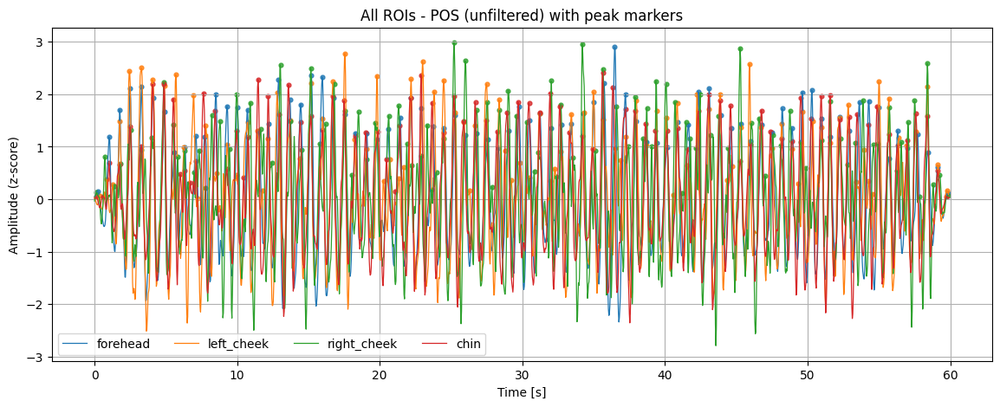

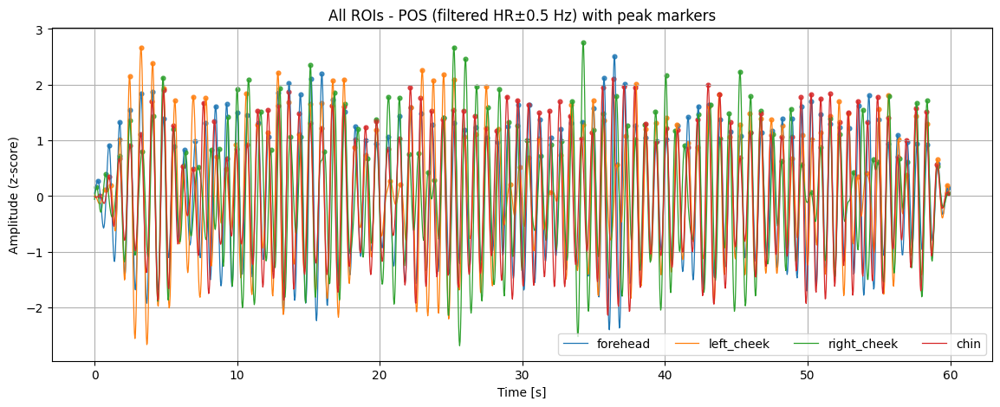

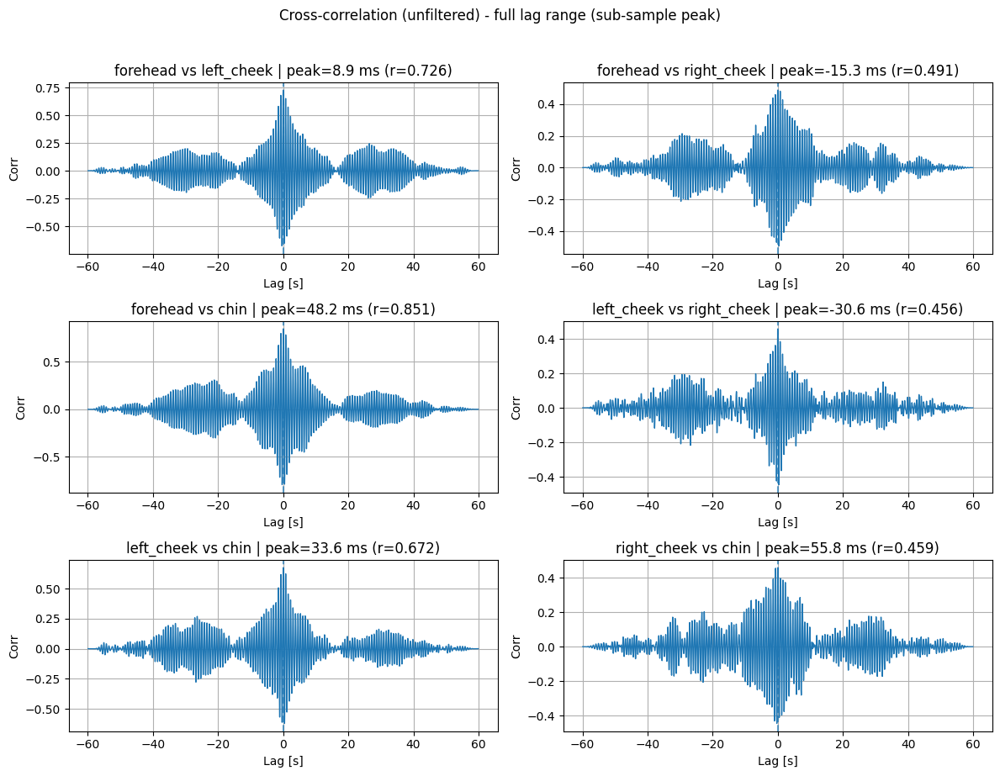

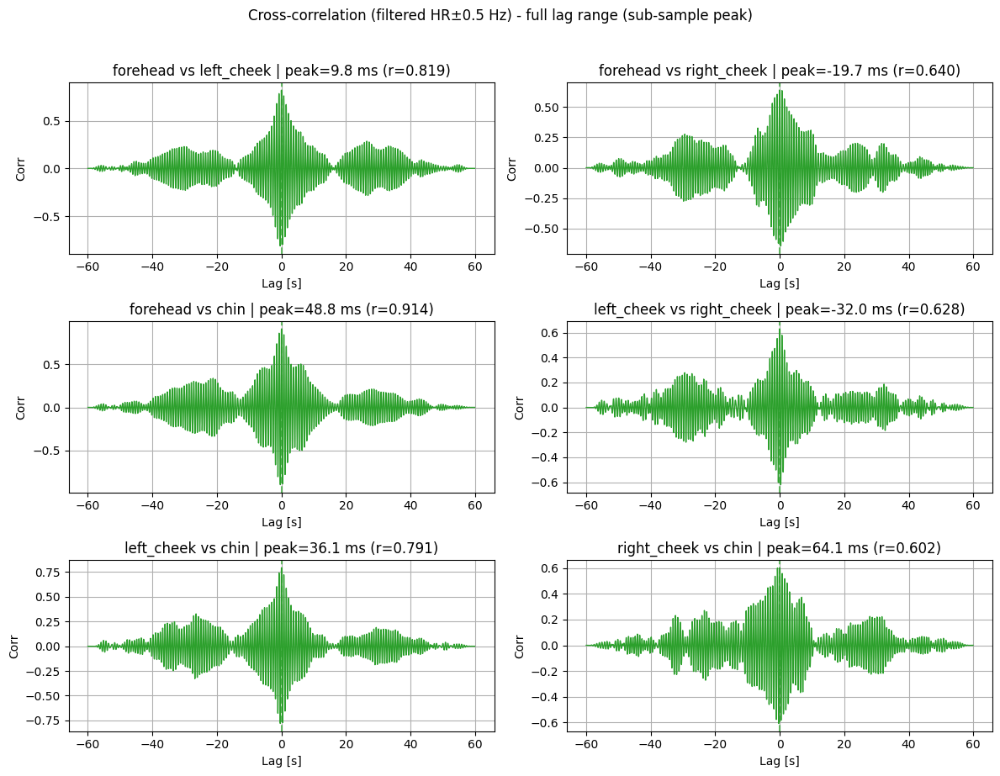

In [ ]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois,
    fs=30,
    show_filtered=True,
    normalize=True,
)



## 10 gt

In [18]:
from IppgSignalObtainer import IppgSignalObtainer

rois_10gt = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "UBFC_DATASET_MERGED/DATASET_1/10-gt/vid.avi", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)



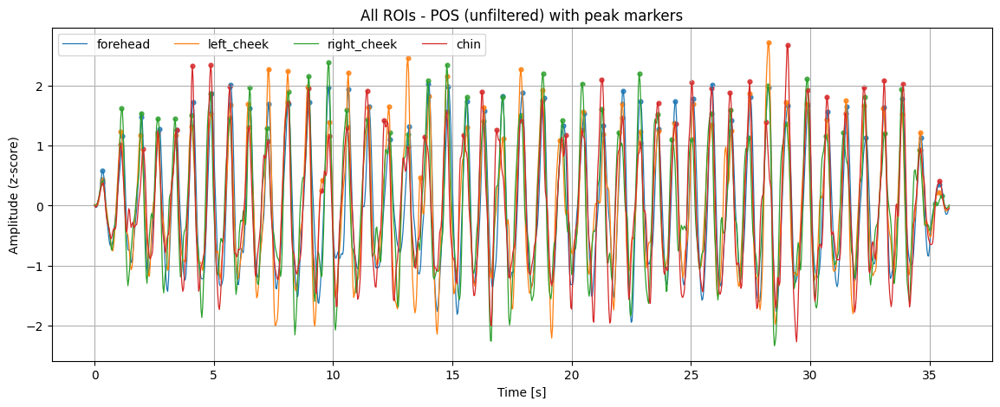

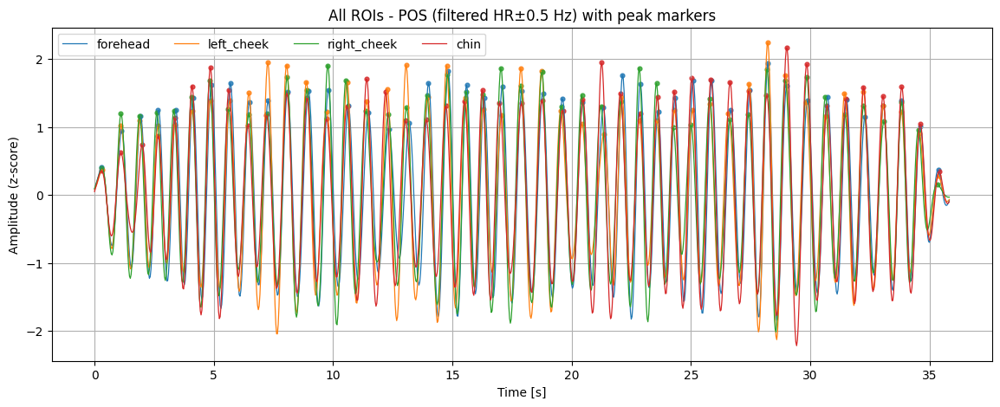

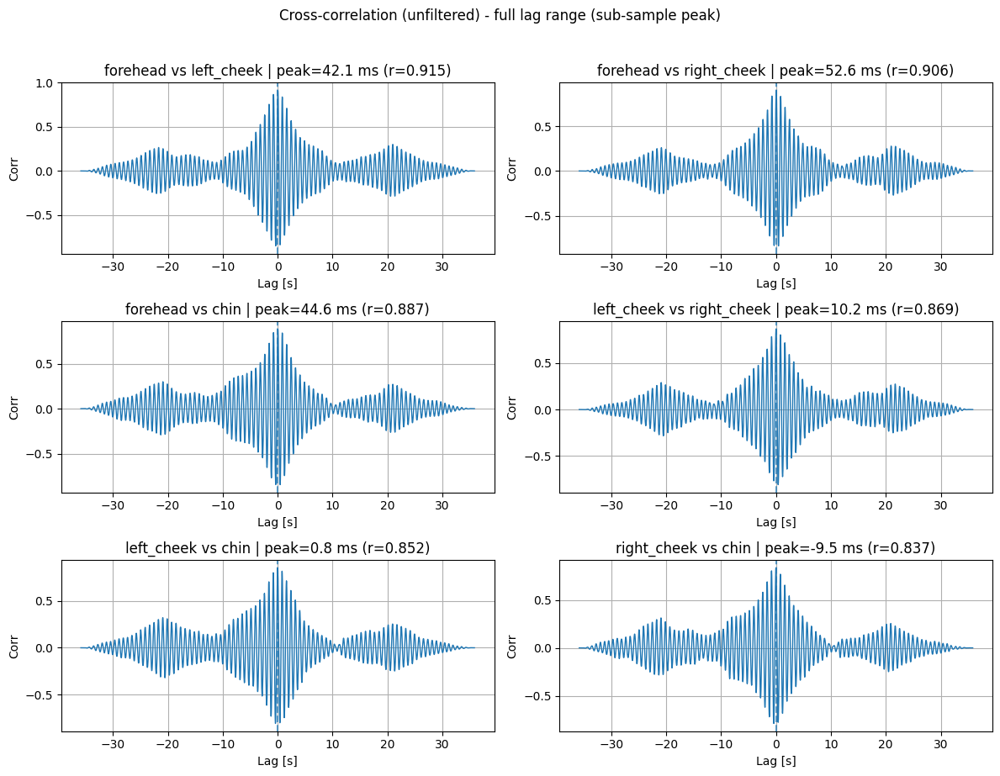

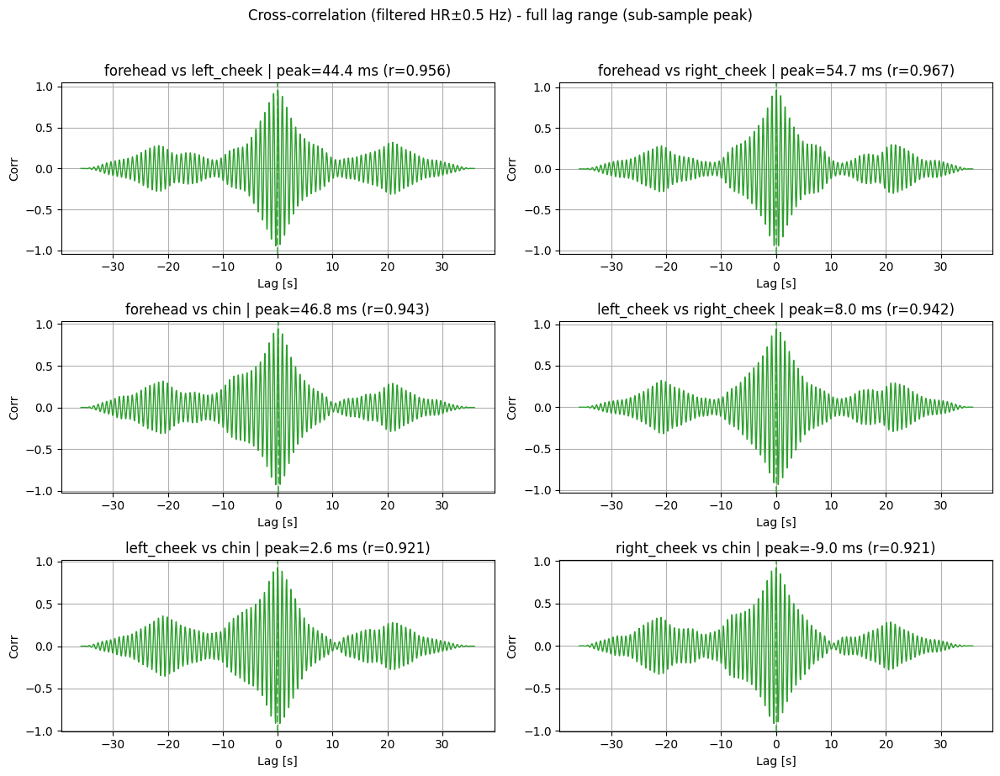

In [14]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_10gt,
    fs=30,
    show_filtered=True,
    normalize=True,
)

## 8 gt

In [19]:
from IppgSignalObtainer import IppgSignalObtainer

rois_8gt = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "UBFC_DATASET_MERGED/DATASET_1/8-gt/vid.avi", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)



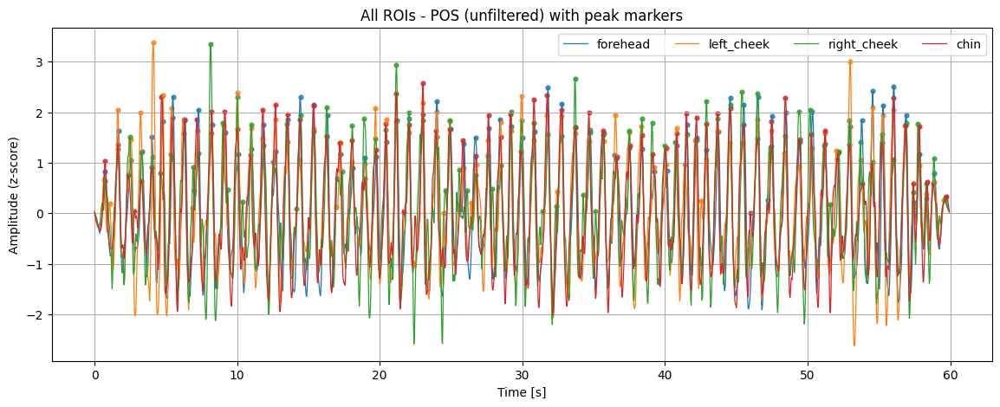

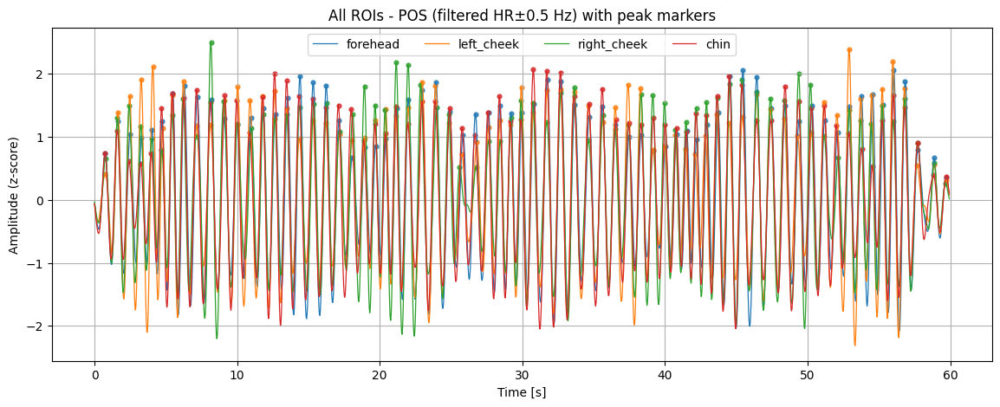

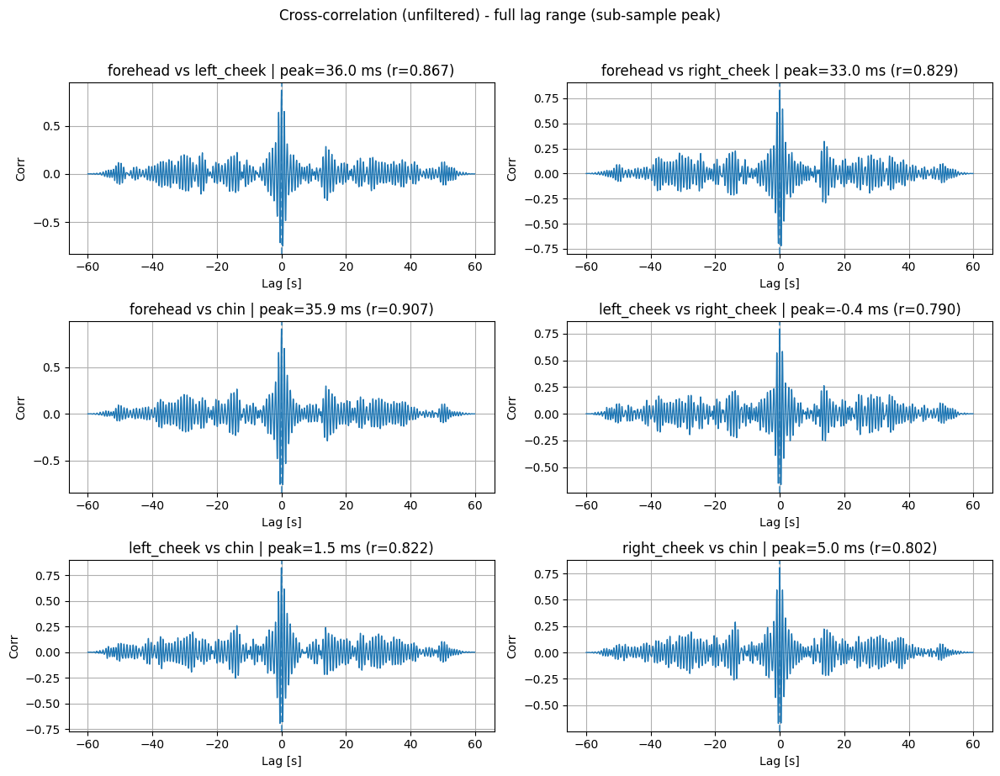

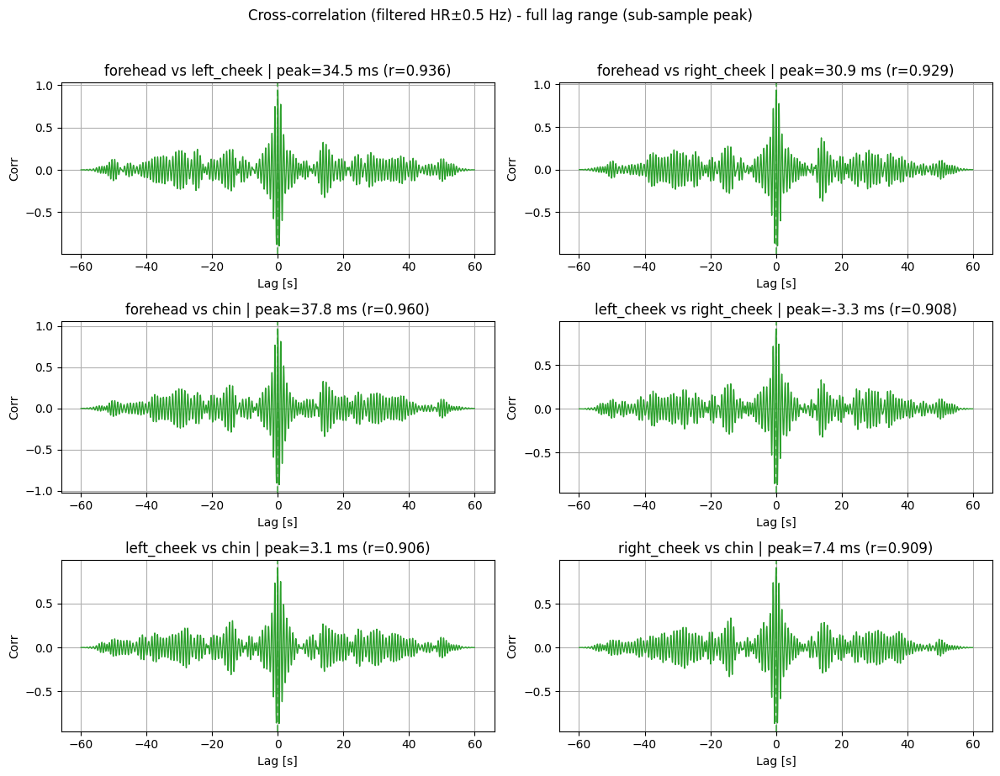

In [10]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_8gt,
    fs=30,
    show_filtered=True,
    normalize=True,
)

## subject 1

In [20]:
from IppgSignalObtainer import IppgSignalObtainer

rois_subj1 = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "UBFC_DATASET_MERGED/DATASET_2/subject1/vid.avi", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)



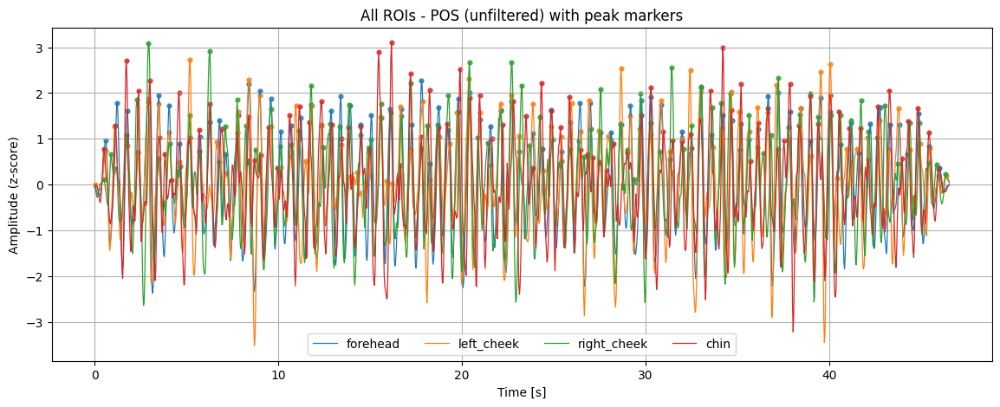

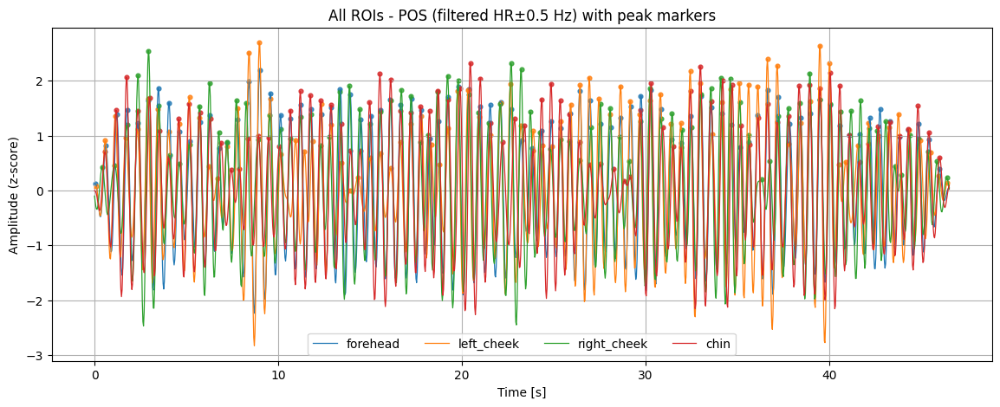

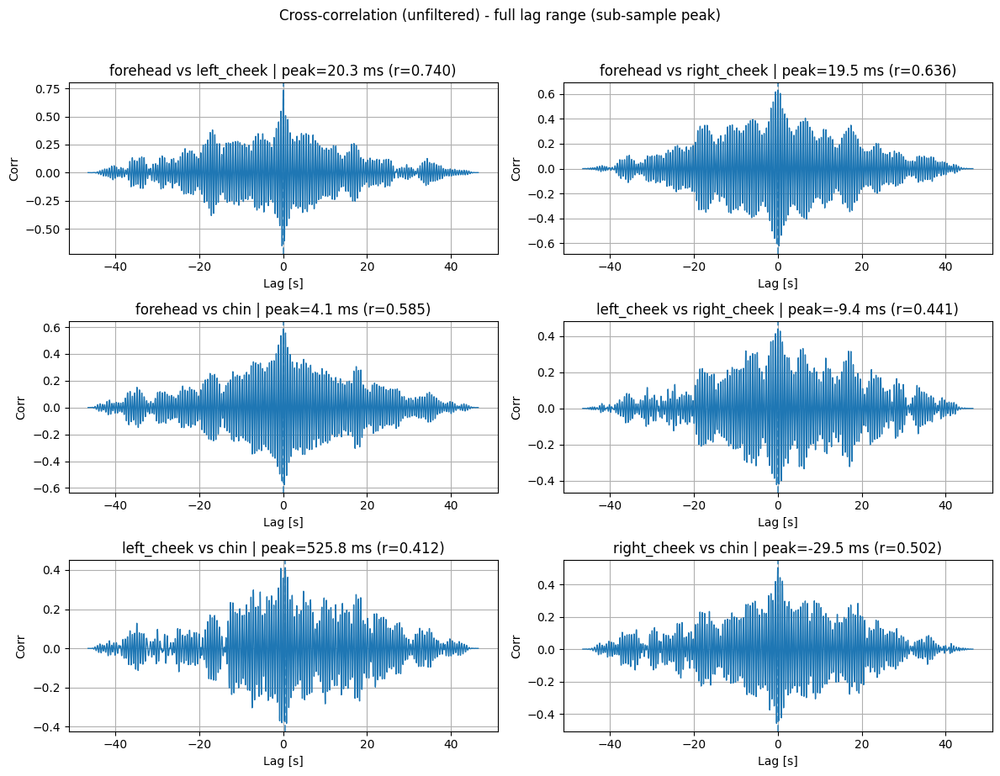

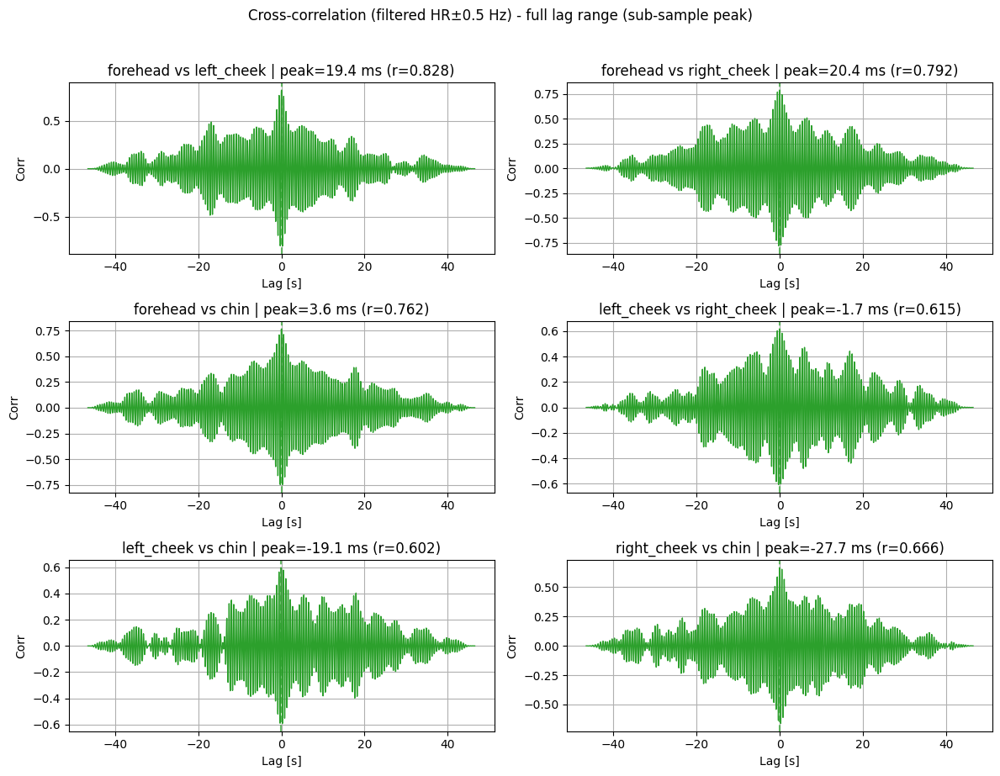

In [ ]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_subj1,
    fs=30,
    show_filtered=True,
    normalize=True,
)

## MI VIDEO A 60

In [3]:
from IppgSignalObtainer import IppgSignalObtainer

rois_pedro = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "video_lossless_20251210_025414.mkv", 60,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)

In [1]:
from IppgSignalObtainer import IppgSignalObtainer

rois_pedro_video_lossless_20251210_030306 = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "video_lossless_20251210_030306.mkv", 60,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)

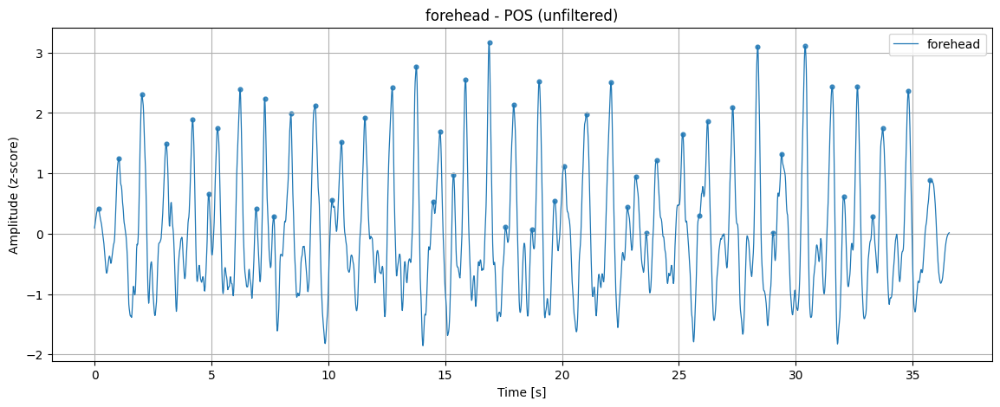

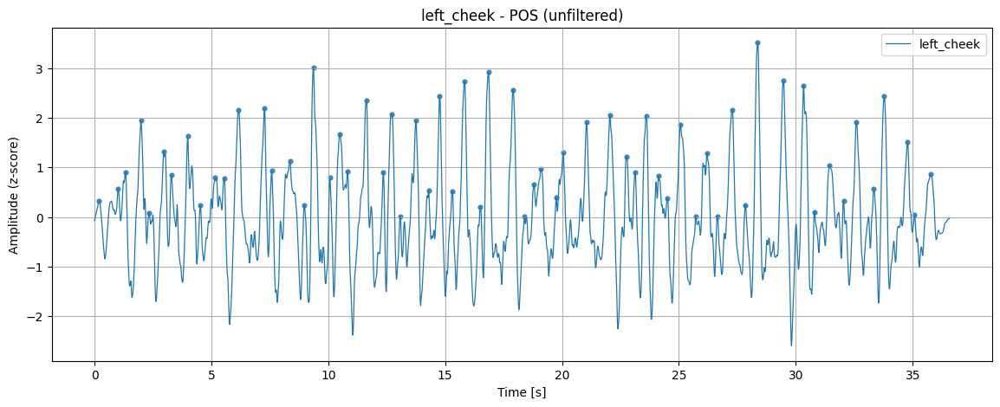

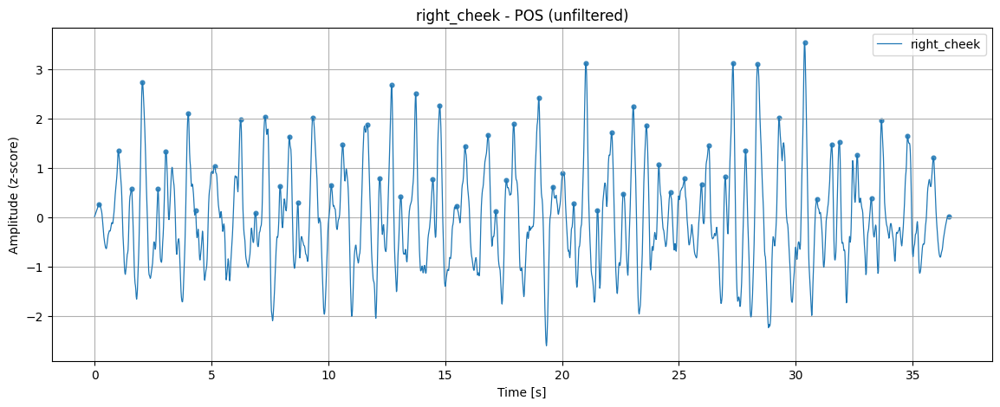

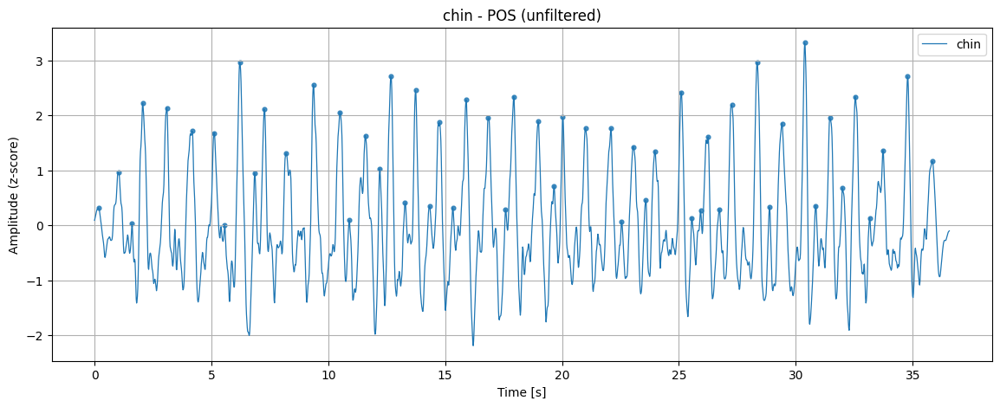

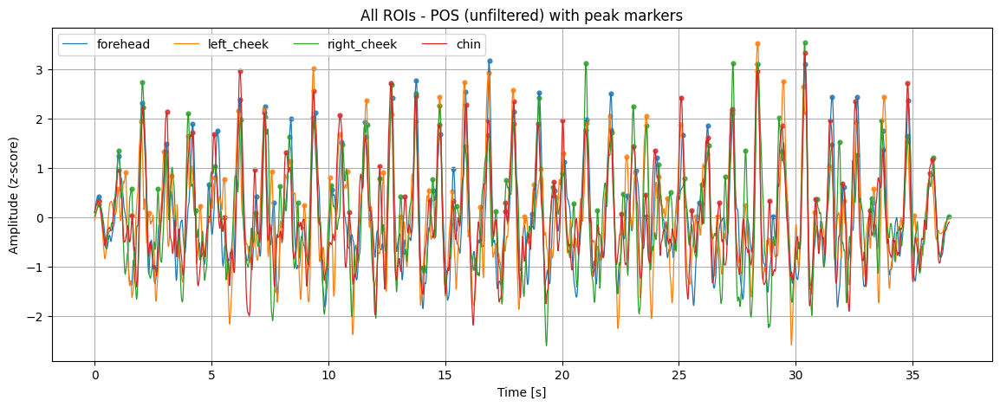

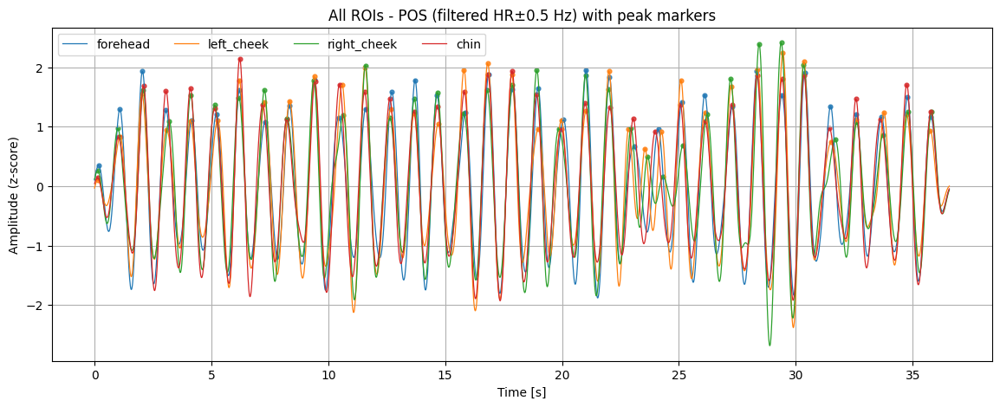

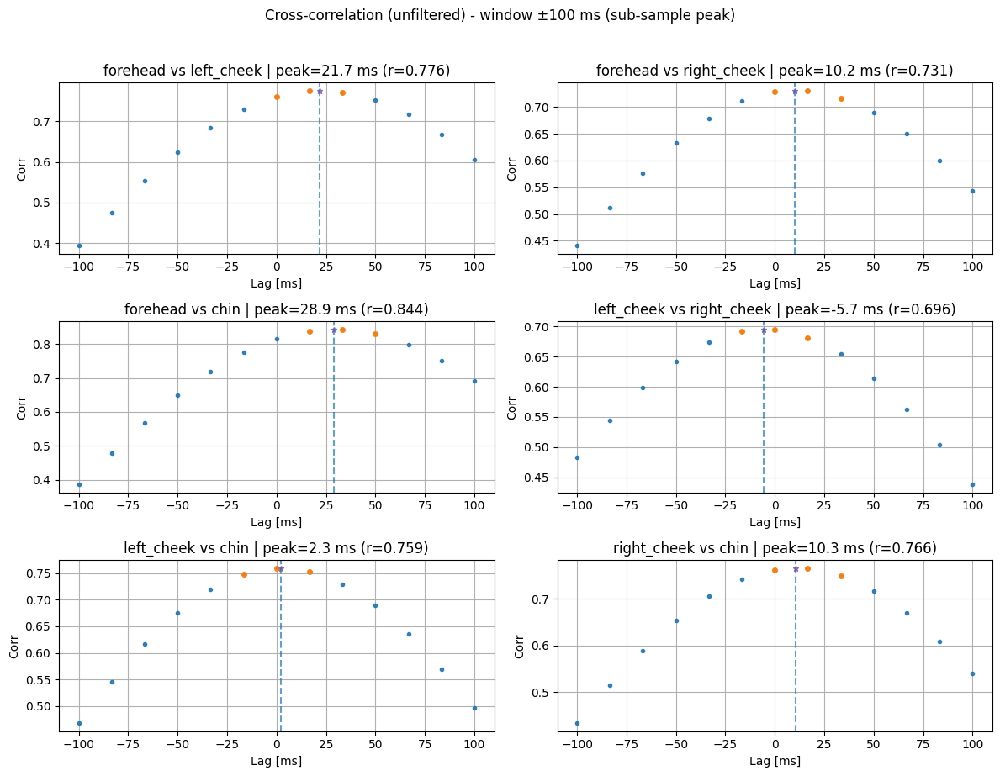

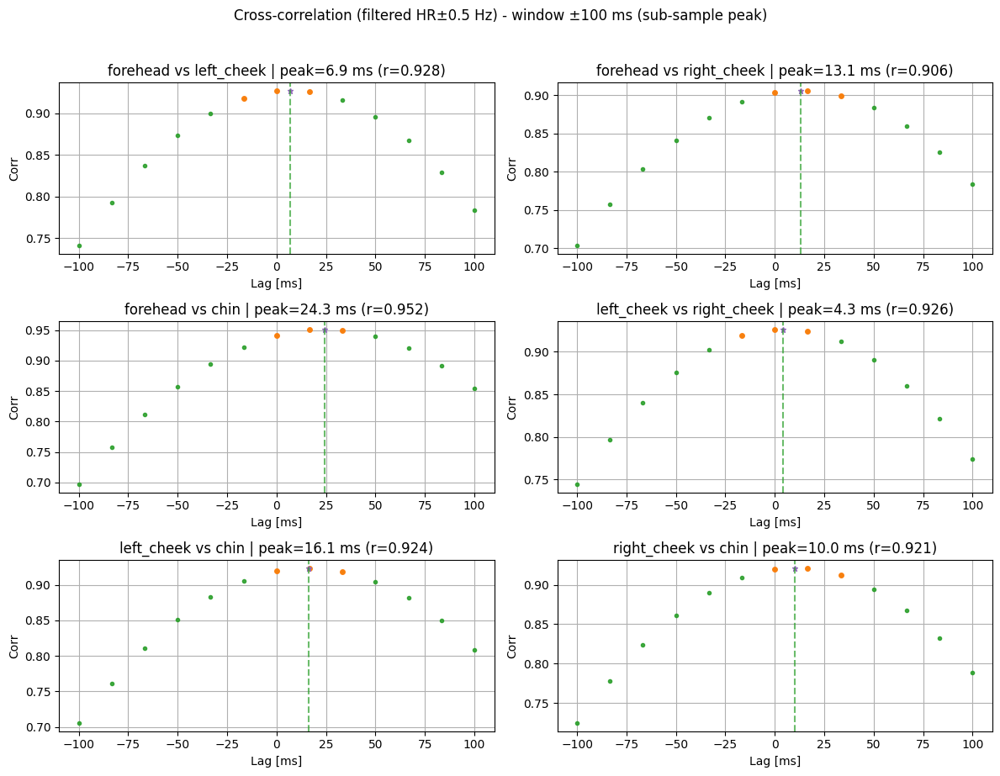

In [5]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_pedro_video_lossless_20251210_030306,
    fs=60,
    show_filtered=True,
    normalize=True,
    plot_individual = True
)

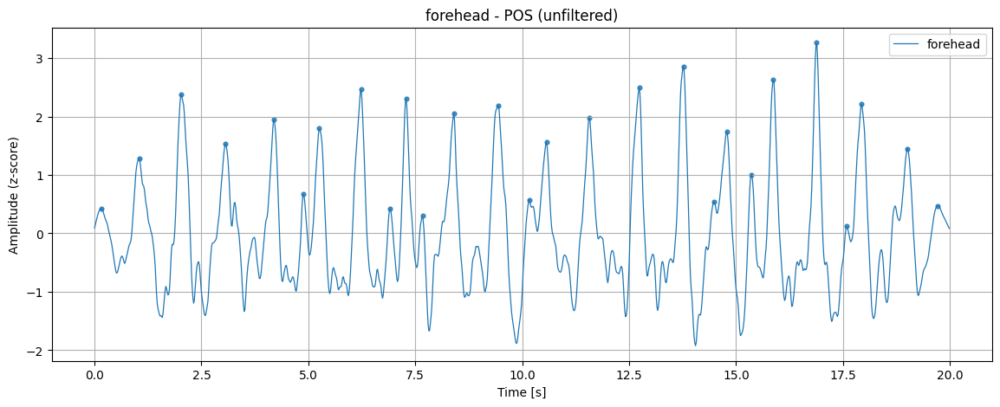

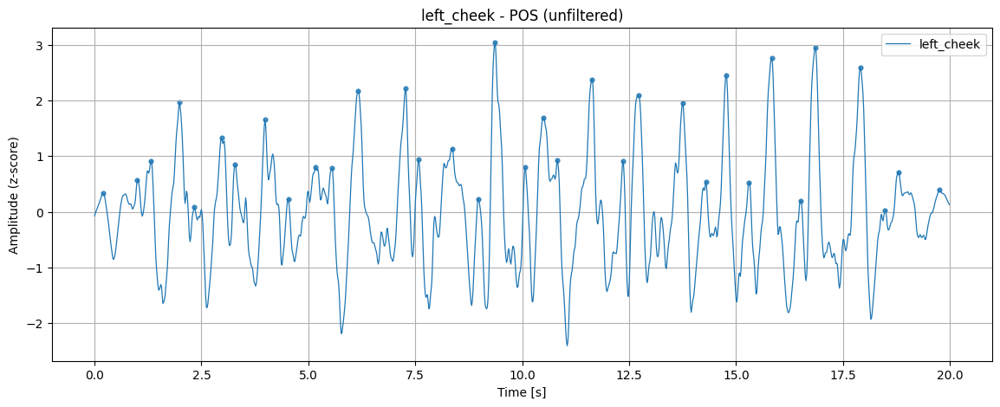

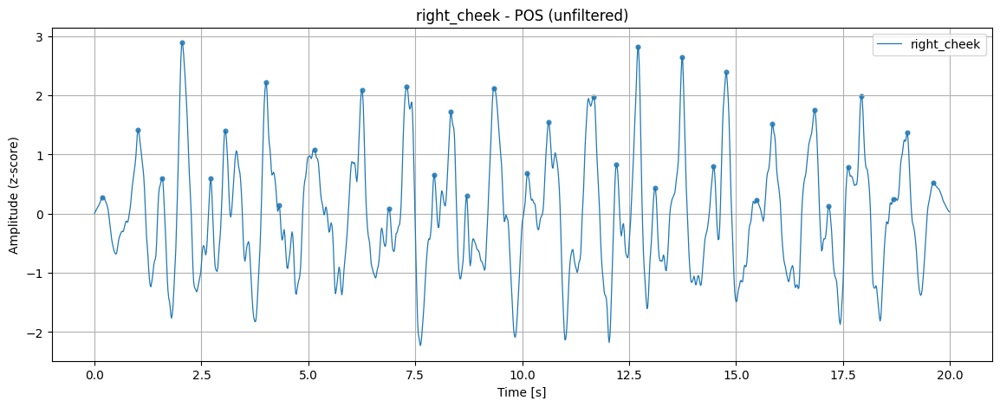

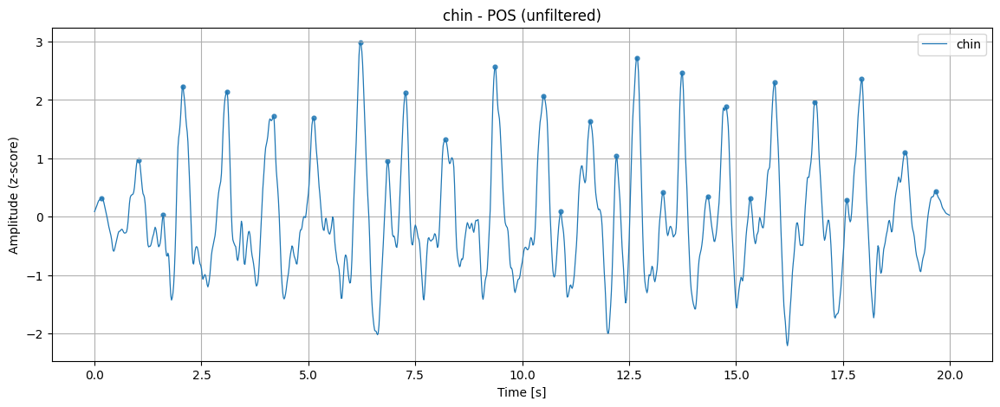

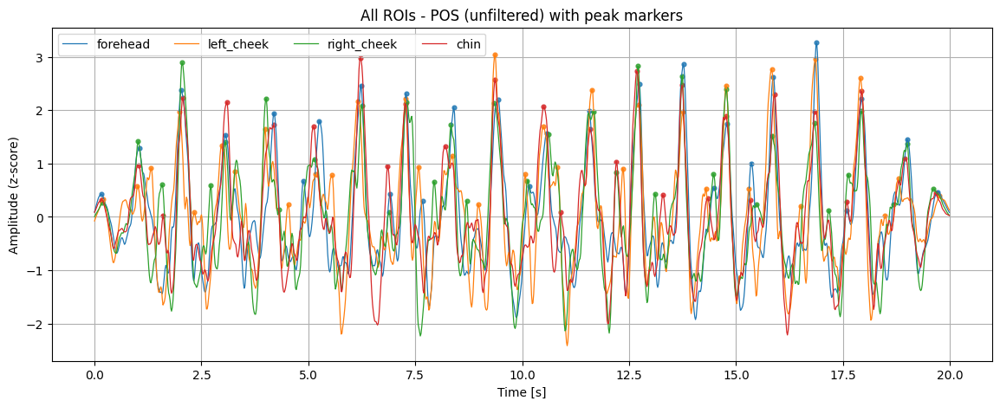

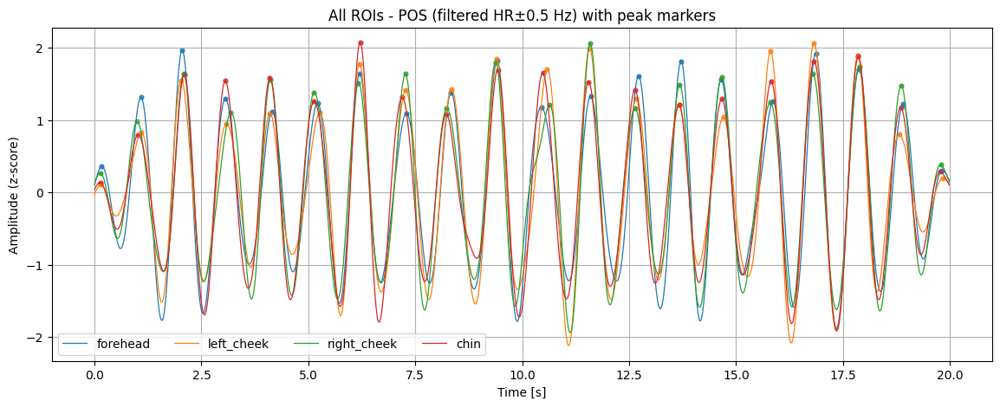

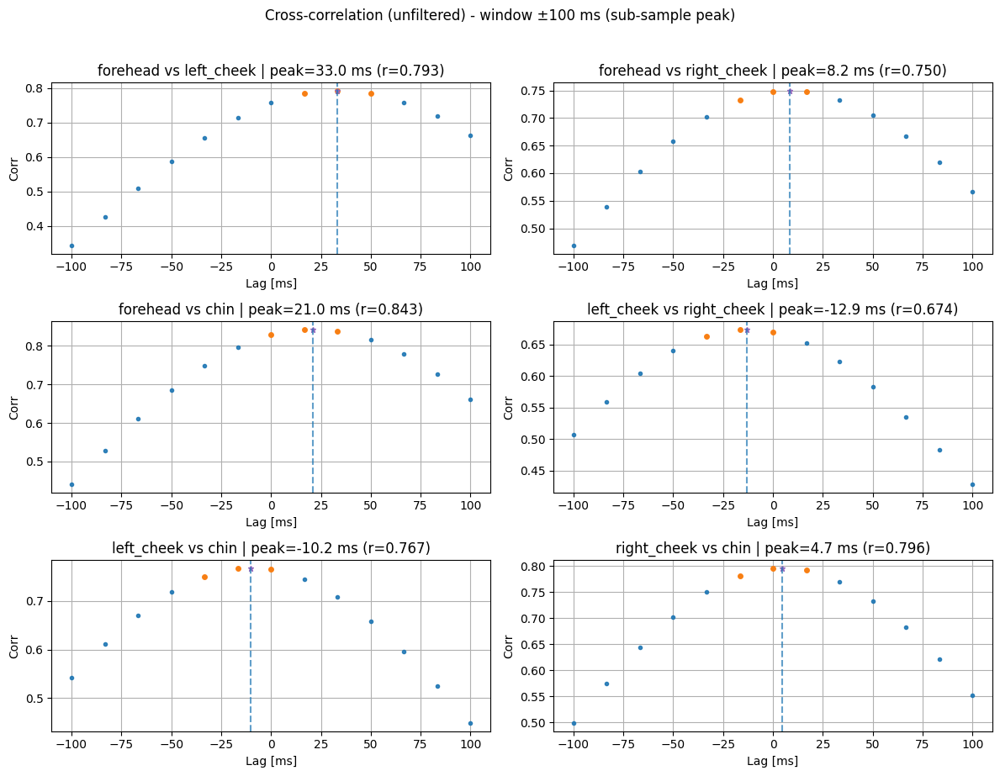

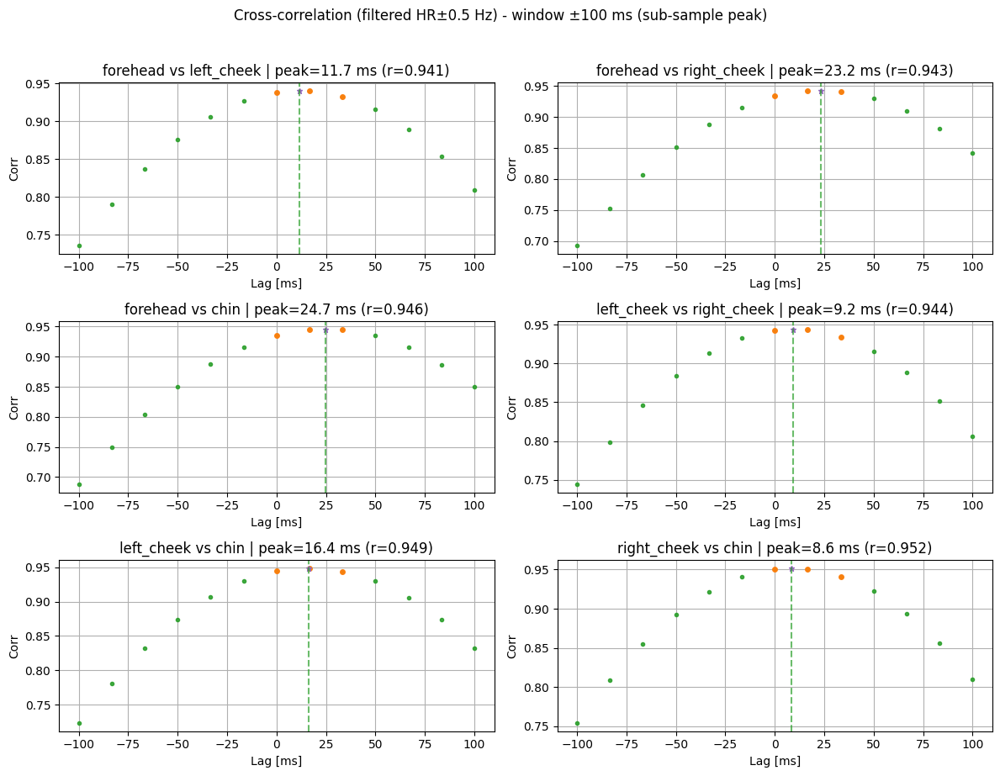

In [6]:

rois_sliced = {}
for roi in rois_pedro_video_lossless_20251210_030306:
    rois_sliced[roi] ={}
    for color in rois_pedro_video_lossless_20251210_030306[roi]:
        rois_sliced[roi][color] = rois_pedro_video_lossless_20251210_030306[roi][color][0:60*20]
pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_sliced,
    fs=60,
    show_filtered=True,
    normalize=True,
    plot_individual = True
)

## mi video a 30 fps 

### Con MJPEG

In [8]:
from IppgSignalObtainer import IppgSignalObtainer

rois_pedro_video_30fps_mjpeg = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "pedro_video_30fps_mjpeg.mkv", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=False
)

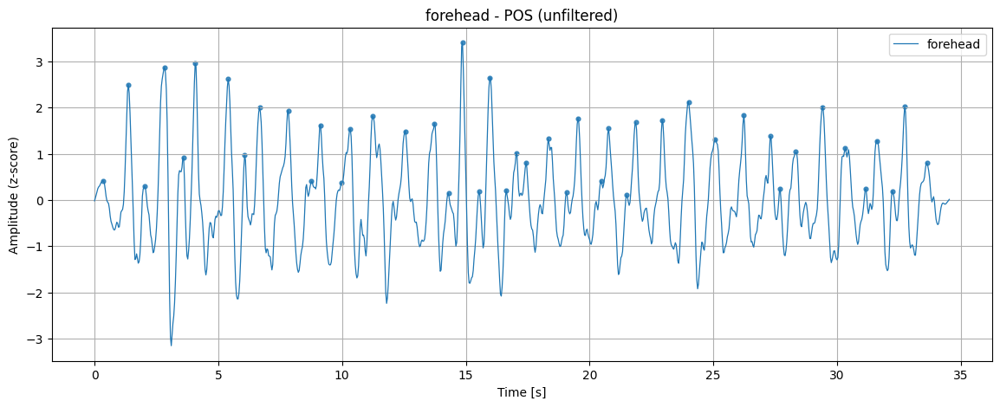

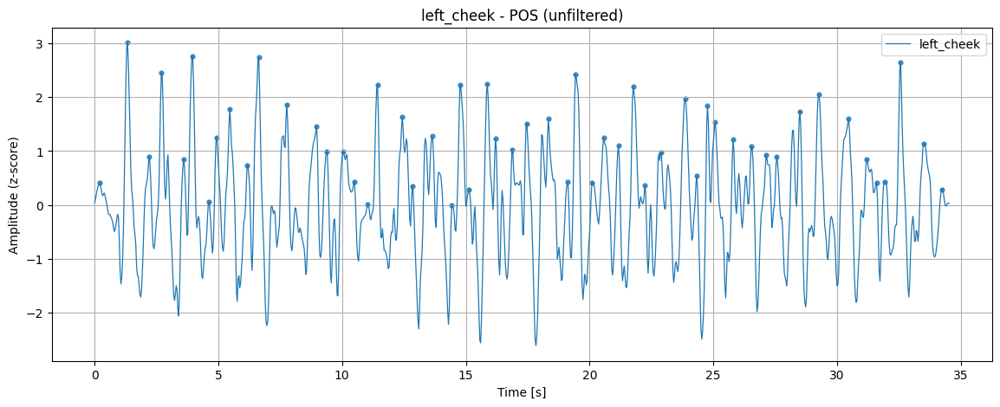

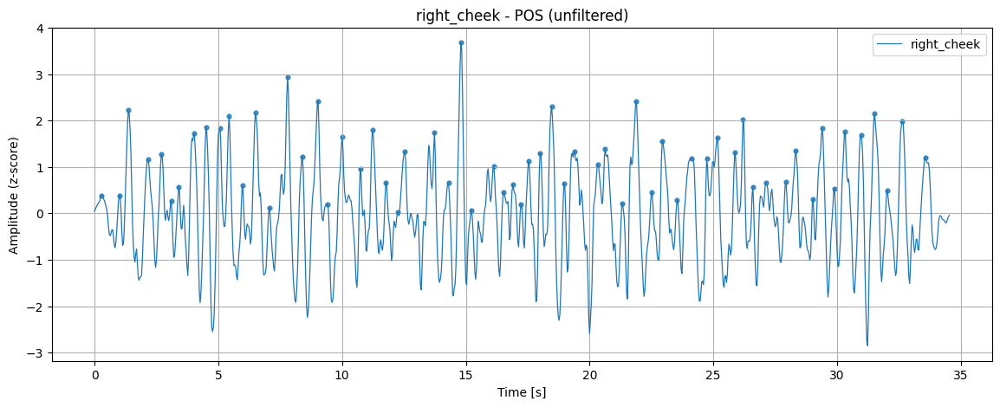

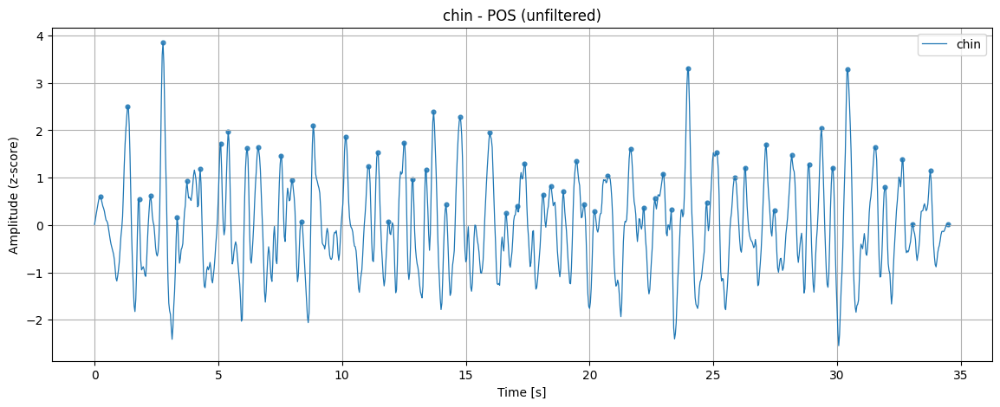

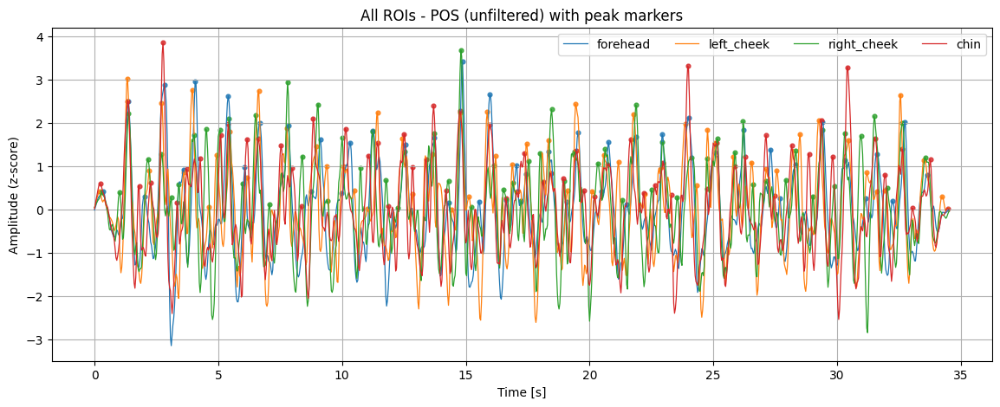

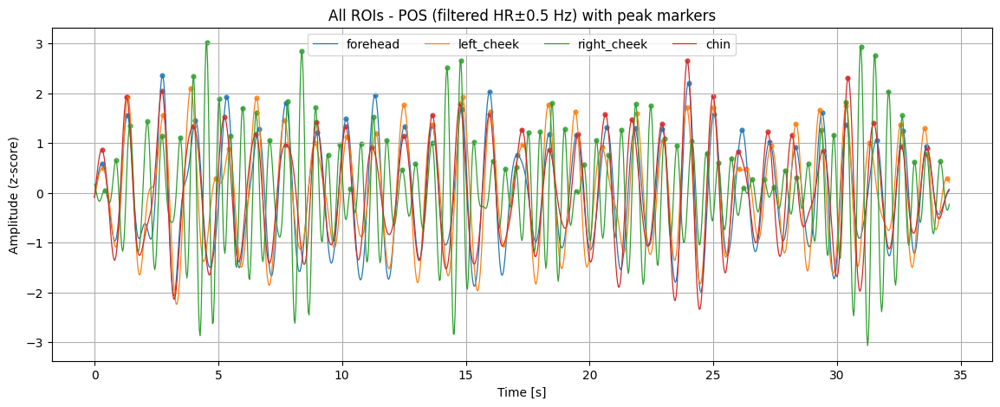

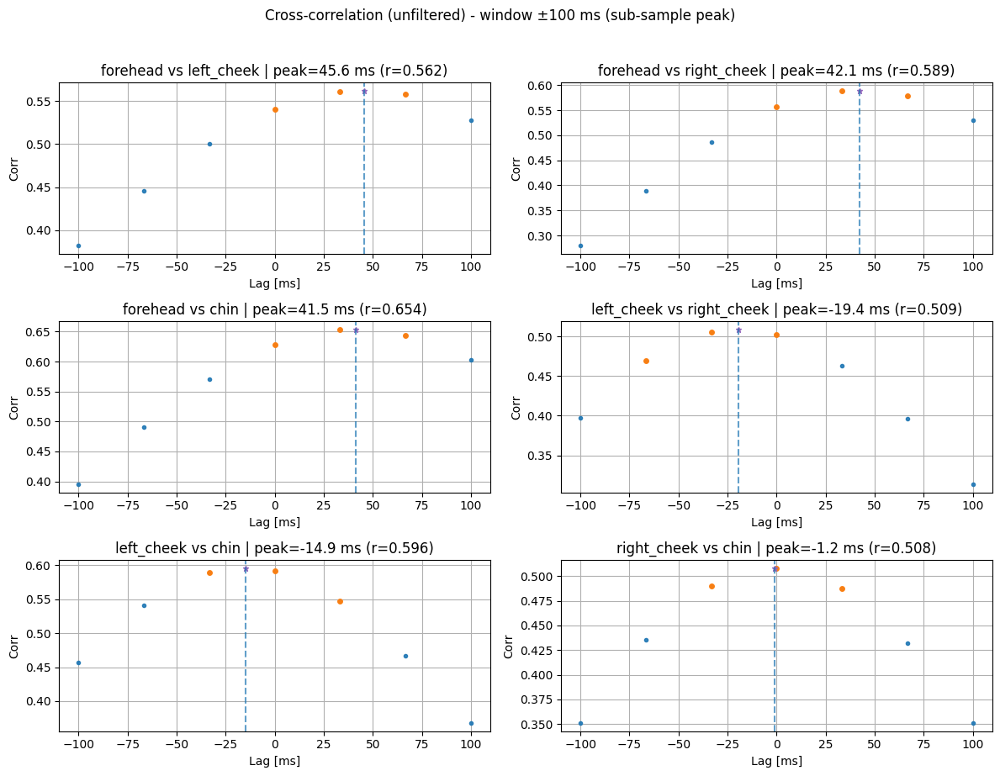

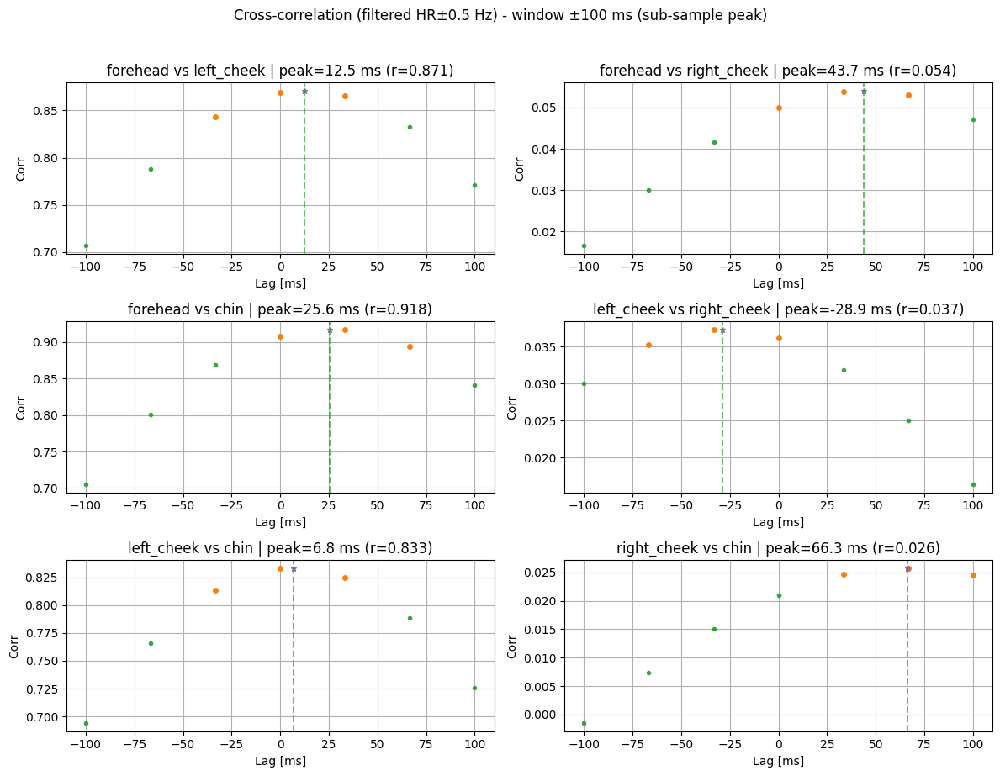

In [13]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_pedro_video_30fps_mjpeg,
    fs=30,
    show_filtered=True,
    normalize=True,
    plot_individual = True
)

### Lossless

In [12]:
from IppgSignalObtainer import IppgSignalObtainer

rois_pedro_video_30fps_lossless = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "pedro_video_30fps_lossless.mkv", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)

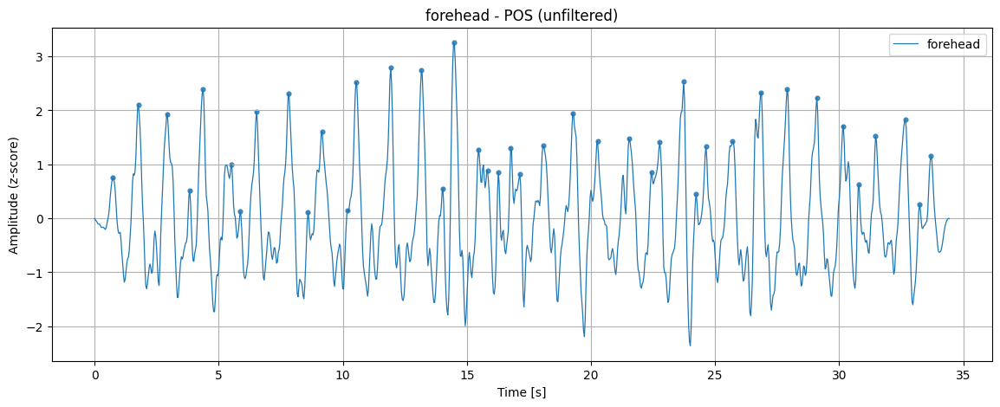

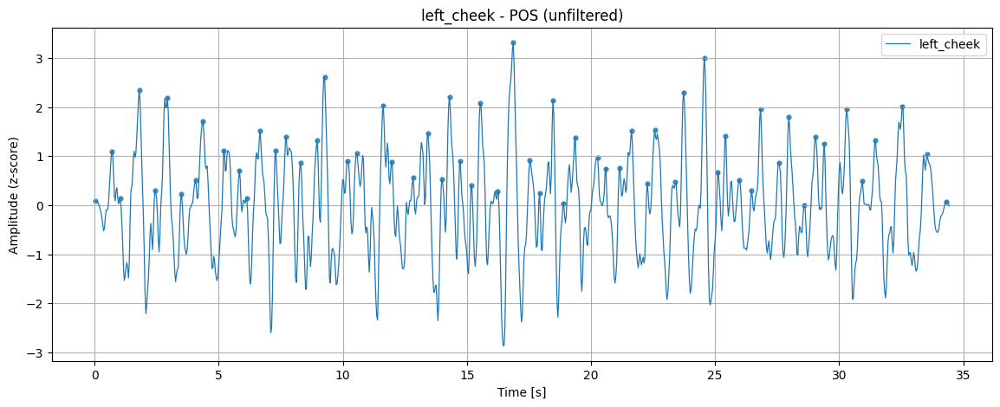

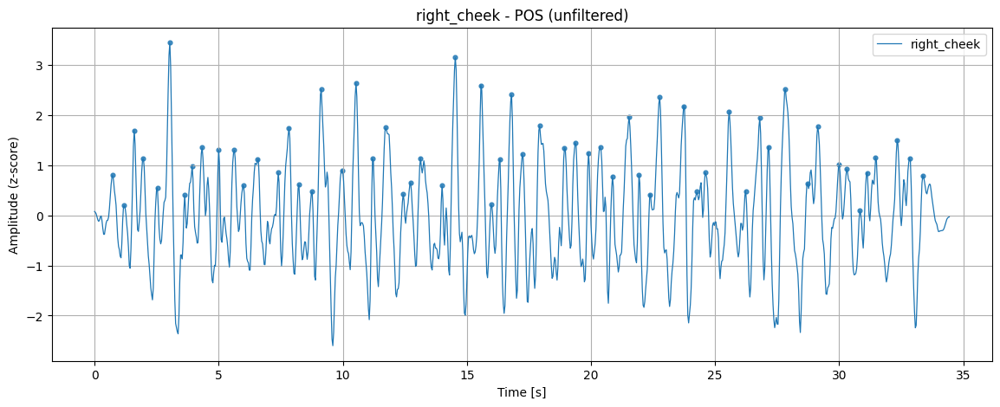

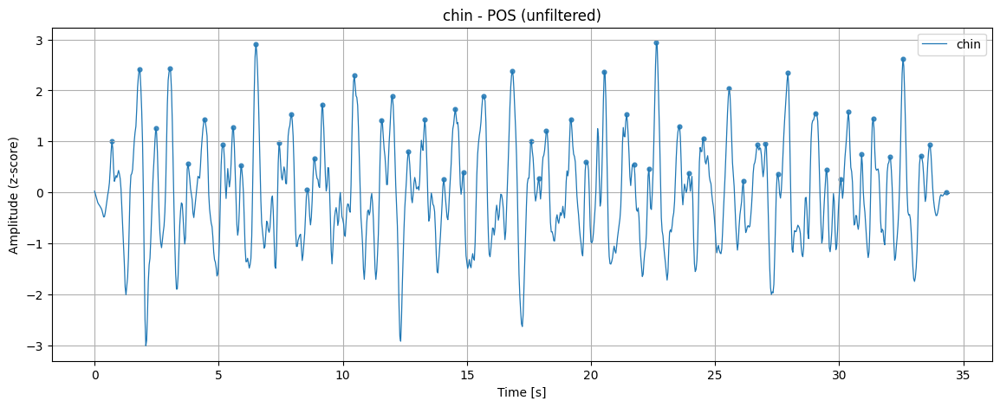

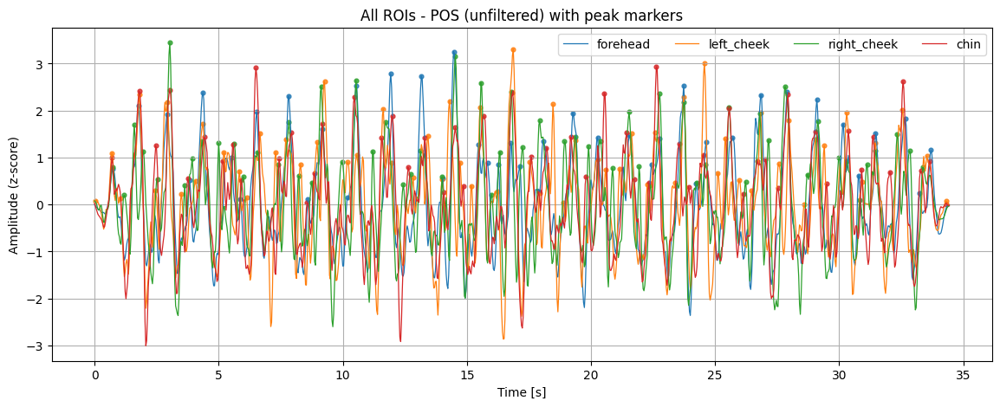

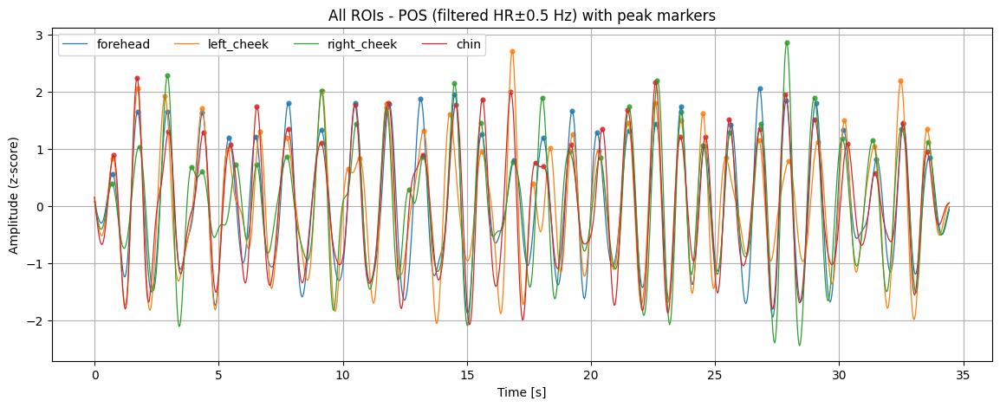

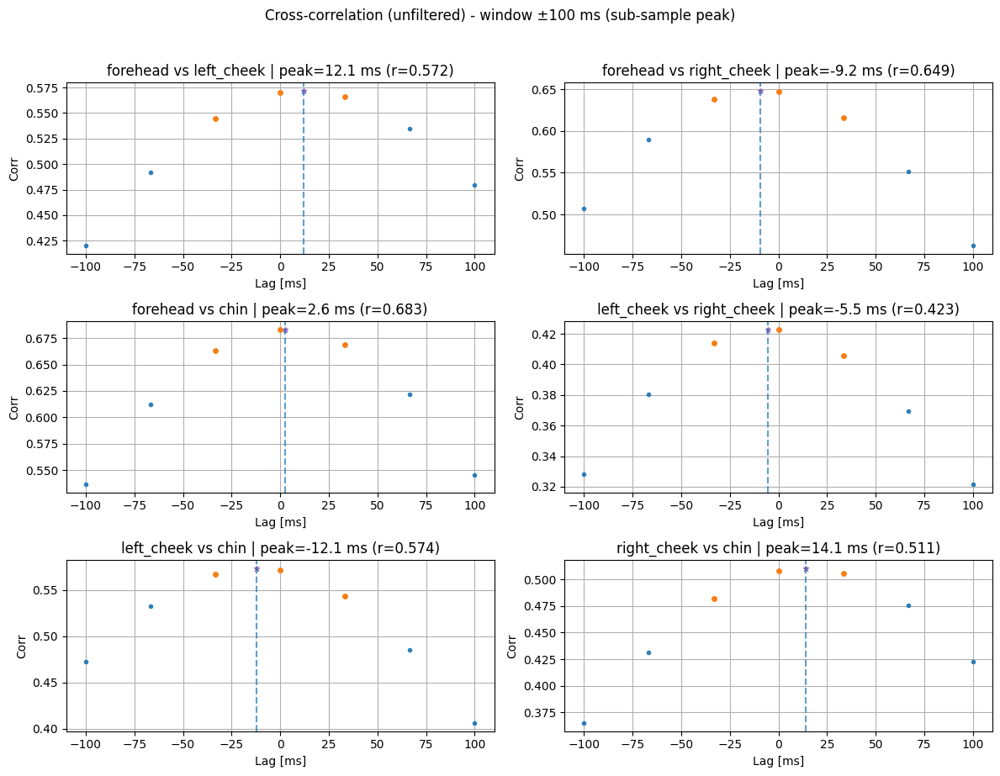

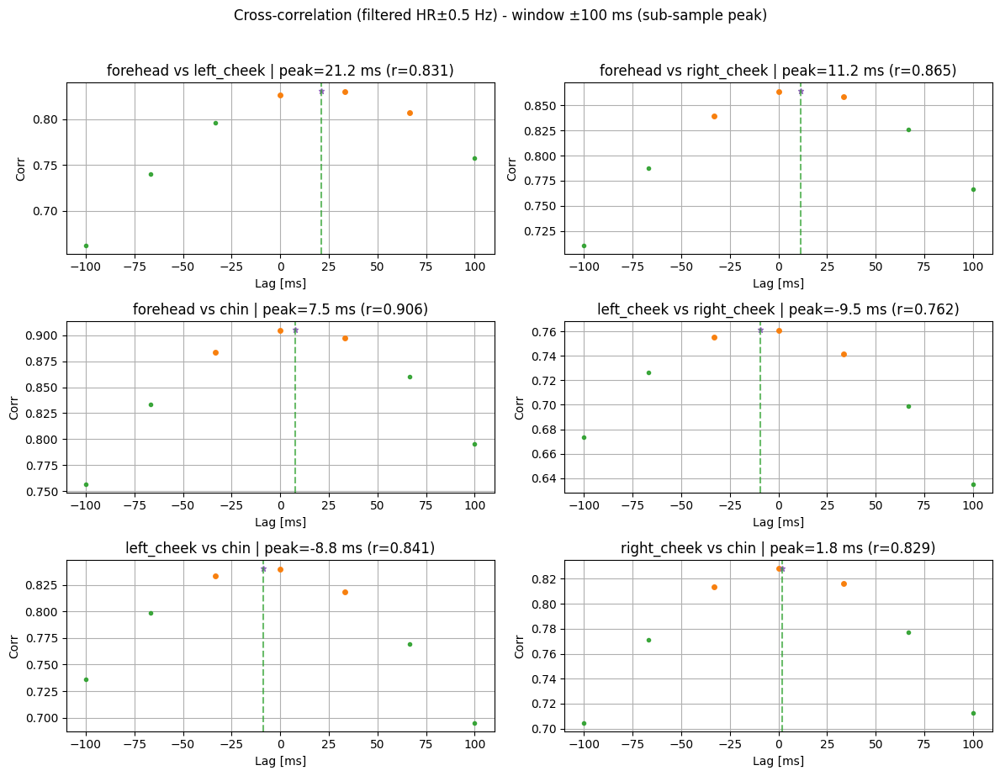

In [14]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_pedro_video_30fps_lossless,
    fs=30,
    show_filtered=True,
    normalize=True,
    plot_individual = True
)